In [1]:
import numpy as np
import pandas as pd
import igraph as ig
import matplotlib.pyplot as plt
import seaborn as sns
import copy
from tqdm import tqdm
import time
import json
import pyreadr
import random


sns.set_theme()

# __Infomap: identify flow modules in networks via Map Equation__
-----
*Raffaele Gaudio 2057974*

*Many real-world networks, such as ecological or social networks, are so large that their structures must be simplified to extract useful information. Community detection algorithms are powerful tools for performing these simplifications. Many of these algorithms, including the popular modularity maximization approach, infer module assignments from an underlying model of the network formation process. However, we are often more interested in how a network's current structure influences the system's behavior rather than how it was formed. The Infomap algorithm is a community detection method that partitions networks by considering the flow of information between nodes, minimizing the so-called Map Equation. The aim of this project is to re-implement the Infomap algorithm for mono-layer directed and undirected networks.*


<a id="main"></a>

## Contents:
- 1. [Theorethical framework](#1)
        - 1.1. [Linking structure and information via Map equation](#1.1)

- 2. [Algorithm implementation](#2)      
        - 2.1 [Nodes visiting frequencies](#2.1)
        - 2.2 [Map equation evaluation](#2.2)
            - 2.2.1. [Modules initialization](#2.2.1)
            - 2.2.2. [Map equation](#2.2.2)
        - 2.3. [Binary merging algorithm for best partition](#2.3)
            - 2.3.1. [Define and merging modules links](#2.3.1)
            - 2.3.2. [Merging modules](#2.3.2)
        - 2.4. [Infomap partition algorithm and visualization](#2.4)
- 3. [Test the algorithm](#3)
        - 3.1. [Simple undirected case](#3.1)
        - 3.2. [Simple directed case](#3.2)
        - 3.3. [StarWars network dataset](#3.3)
        - 3.4. [Kongfjorden network dataset](#3.4)
- 4. [Conclusions and future works](#4)

## 1. Theoretical framework

As even small networks can have an enormous number of possible partitions, search algorithms measure the quality of a given partition with an objective function. Infomap optimizes the objective function known as the Map equation [1] and finds the partition that best compresses a description of flows on the network. The network flows are modeled by a random walker. The random walker moves across nodes in a way that depends on the direction and weight of the links and tends to stay longer in dense areas, which then represent modules. For a given partition of the network, there is an associated information cost, measured in bits, for describing the movements of the random walker. The Map equation converts the flow rates within and between the modules to an information-theoretic modular description measure of the random walker's movements on the network. Minimizing the Map equation over possible network partitions corresponds to detecting the most modular structure possible in the dynamics on the network.

### 1.1. Linking structure and information via Map equation

There is a duality between the problem of compressing a data set, and the problem of detecting and extracting significant patterns or structures within those data. To exploit the inference-compression duality for dynamics on networks, we envision a communication process in which a sender wants to communicate to a receiver about movement on a network. We represent the data that we are interested in – the trace of the flow on the network – with a compressed message. This takes us to the heart of information theory, and we can employ Shannon’s source coding theorems to find the limits on how far we can compress the data. 
For a module partition $M$ of $n$ nodes $\alpha = 1,2,...,n$ into $m$ modules $i = 1,2,...,m,$ we define a lower bound on code length to be $L(M)$. In order to calculate $L$ for an arbitrary partition, we first invoke Shannon’s source coding theorem, which implies that when you use $n$ codewords to describe the $n$ states of a random variable $X$ that occur with frequencies $p_i$, the average length of a codeword can be no less than the entropy of the random variable $X$ itself: $H(X) = − \sum_{i=1}^n p_i \log(p_i)$. This provides us with a lower bound on the average length of codewords for each codebook. 

To calculate the average length of the code describing a step of the random walk, we only need to weight the average length of codewords from the index codebook (the one that describes the movment of the random walker between modules) and the module codebooks (that describes the movment of the walker within the module) by their rates of use.
 
The map eaquation assumes the form:
$$
L(M) = q_{\curvearrowright} H(\mathcal{Q}) + \sum_{i=1}^m q_{\circlearrowright}^i H(\mathcal{P}^i)
$$

Here $H(\mathcal{Q})$ is the frequency-weighted average length of codewords in the index codebook and $H(\mathcal{P}^i)$ is frequency-weighted average length of codewords in module codebook $i$.

Called $q_{i\curvearrowright}$ the probability that a walker exit module $i$,  the index codebook is used at rate:
$$
q_{\curvearrowright}=\sum_{i=1}^m q_{i\curvearrowright}
$$

With $p_\alpha$ the probability of visiting node $\alpha$, module codebook $i$ is used at rate:
$$
q_{\circlearrowright}^i= q_{i\curvearrowright} + \sum_{\alpha \in i}p_{\alpha}
$$
the fraction of time the random walk spends in module $i$ plus the probability that it exits the module.

----

[1] Rosvall, Martin, Daniel Axelsson, and Carl T. Bergstrom. *"The map equation." The European Physical Journal Special Topics* 178.1 (2009): 13-23.

## 2. Algorithm implementation

In this section, we proceed with a step-by-step description of our Python implementation of the Infomap algorithm for mono-layer networks. We aim to build a class that, given the adjacency matrix of a network, produces reasonable partitions of the associated graph and visualizes them using the Python package $\texttt{igraph}$.

The outline of the design process of the class is as follows:

- Determine the visiting frequencies of the nodes for a random walker on the network.
- Define the modules structure and initialize a module for each node.
- Implement the Map equation.
- Implement a binary merging algorithm that merges modules with respect to the minimal value of the Map equation.
- Implement a wrapper function that iteratively applies the algorithm to the network.
- Visualize the resulting partition.

### 2.1. Nodes visiting frequencies
Our first step is to evaluate the visiting frequency for a random walker for each node in our network. In order to do this, we consider the associated markovian process and we take the stationary state as nodes probability distribution. 

The literature suggests two approches for this frequencies evaluation:
- using relative weights
- using a PageRank algorithm.

The first approach is desiderable for weighted undirected networks because in this case the node visit frequency for node $\alpha$ corresponds to the relative weight $w_\alpha$ of the links connected to the node [1]. The relative weight is the total weight of the links connected to the node divided by twice the total weight of all links in the network, which corresponds to the total weight of all link-ends.

In this case the map equation assumes the form:
$$
L(M) = w_{\curvearrowright}\log\left(w_{\curvearrowright} \right) - 2 \sum_{i=1}^m w_{i\curvearrowright} \log(w_{i\curvearrowright}) - \sum_{\alpha=1}^n w_{\alpha} \log(w_{\alpha}) + \sum_{i=1}^m \left( w_{i\curvearrowright} + w_i \right) \log \left( w_{i\curvearrowright} + w_i \right)
$$
 with $w_i=\sum_{i\in \alpha}w_\alpha$ the relative weight of module $i$, $w_{i\curvearrowright}$ the relative weight of links exiting module $i$ and $w_{\curvearrowright}=\sum_{i=1}^m w_{i\curvearrowright}$ the total relative weight of links between modules.

The PageRank algorithm determines the stady state if we allowd a small teleportation probability $\tau$ between nodes in the random walk. In this scenario, the random walker is often referred to as a random surfer. The surfer moves as follows: at each time step, with probability $d = 1-\tau$ , the random surfer follows one of the outgoing links from the node $\alpha$ that it currently occupies to the neighbor node $\beta$ with probability proportional to the weight of the outgoin link $w_{\alpha\beta}$. With the remaining probability $\tau$ the random surfer “teleports” with uniform probability to a random node anywhere in the system. This algorithm is more suitable for directed weighted networks [1][2]. In order to obtain ergodic visiting frequecies we applied the power method with a tolerance factor of $10^{-10}$ and a dumping factor of $d=0.85$ accordingly to the Google's algorithm.


--------
[2] Rosvall, Martin, and Carl T. Bergstrom. *"Maps of random walks on complex networks reveal community structure." Proceedings of the national academy of sciences* 105.4 (2008): 1118-1123.


In [2]:
def relative_weights(M):
    """
    function that evaluetes the stationary state for a markovian process given the transition matrix
    input:  - M: matrix, transition matrix

    output: - v: list, list of visiting frequecy of each node

    """        

    total_weight = np.sum([np.sum(M[i]) for i in range(M.shape[1])])
    v = [np.sum(M[i])/total_weight for i in range(M.shape[1])]

    return v

In [3]:
def normalize_matrix(M, axis=0):
    """
    function that normalizes a matrix
    input:  - M: matrix
            - axis:int, * 0: normalization by cols
                        * 1: normalizaion by rows

    output: - nomalized matrix
    """
    
    sums = np.sum(M, axis=axis)
    # avoid division by 0
    sums[sums == 0] = 1

    return M / sums


def pagerank(M, d=0.85, tol=1e-10, axis=0):
    """ 
    function that evaluetes the stationary state for a markovian process with teleportation given the transition matrix
    input:  - M: matrix, trasnition matrix
            - d: float, dumping factor
            - tol: float, tolerance parameter
            - axis: int,   * 0: normalization by cols
                            * 1: normalizaion by rows

    output: - v: list, list of visiting frequencies of each node
    """

    M = normalize_matrix(M, axis=axis)  
    N = M.shape[1]  
    w = np.ones(N) / N  
    M_hat = d * M  
    
    v = M_hat @ w + (1 - d) / N  
    
    while np.linalg.norm(w - v) >= tol:
        w = v
        v = M_hat @ w + (1 - d) / N
    
    return v

In [4]:
# test the functions:

A = np.array([[0,1,1,0,0,0],
            [1,0,1,0,0,0],
            [1,1,0,0,0,1],
            [0,0,0,0,1,1],
            [0,0,0,1,0,1],
            [0,0,1,1,1,0]])

W = np.array([[0,3,1,0,0,0],
            [3,0,2,0,0,0],
            [1,2,0,0,0,4],
            [0,0,0,0,5,1],
            [0,0,0,5,0,1],
            [0,0,4,1,1,0]])


print("Reraltive weights:")
print(f" unweighted: {relative_weights(A)}")
print(f" weighted: {relative_weights(W)}\n")

print("Pagerank:")
print(f" unweighted: {pagerank(A)}")
print(f" weighted: {pagerank(W)}")

Reraltive weights:
 unweighted: [0.14285714285714285, 0.14285714285714285, 0.21428571428571427, 0.14285714285714285, 0.14285714285714285, 0.21428571428571427]
 weighted: [0.11764705882352941, 0.14705882352941177, 0.20588235294117646, 0.17647058823529413, 0.17647058823529413, 0.17647058823529413]

Pagerank:
 unweighted: [0.1459854 0.1459854 0.2080292 0.1459854 0.1459854 0.2080292]
 weighted: [0.12981451 0.15712166 0.2032673  0.1690803  0.1690803  0.17163592]


Given the ergodic visiting frequencies of the nodes, we can also obtain from the adjacent matrix the list of connection between nodes and the relative weights. All this information are encapsuled in a DataFrame for better accesibility by the function $\texttt{graph}$ _ $\texttt{info}$.

In [5]:
def graph_info(adjacent_matrix, pagerank_on=True, d=0.85, tol=1e-10, normalize_weights=True):
    """
    function that given the ajacency matrix of a graph produces a dataframe containing for each node: 
          * the visiting frequencies for the stationary state for the associate markovian process
          * a list of linked nodes
          * a list of weights for each link 

    input:    - adjacencent_matrix: matrix, adjacent matrix of the graph
              - pagerank: bool, 
              - d: float, damping factor
              - tol: float, tolerance for the pagerank algorithm
              - normalize_weights: bool, normalization of the weights for each node connection
              
    output:   - graph_info_df: dataframe
    """

    nodes_list =  np.arange(adjacent_matrix.shape[0])
    links_for_node = [list(i) for i in np.column_stack(adjacent_matrix)]  
    weigths = []

    for node in nodes_list:
        links = adjacent_matrix[:,node]
        weigths.append([links[i] for i in range(len(links)) if links[i]!=0]) 
        
    if pagerank_on is True:
        stationary_solution = pagerank(adjacent_matrix,d=d,tol=tol)

    else:
        stationary_solution = relative_weights(adjacent_matrix)

    nodes_links_dict = {}
    for node, links in zip(nodes_list,links_for_node):
        nodes_links_dict[node] = links

    linked_nodes = []
    for i in range(len(nodes_links_dict)):
        possible_links = nodes_links_dict[i]
        indeces = [i for i in range(len(possible_links)) if possible_links[i] != 0]
        linked_nodes.append(indeces)

    if normalize_weights:
        weigths = [[i / sum(node_weights) if sum(node_weights) != 0 else 0 for i in node_weights] for node_weights in weigths]

    graph_info_df = pd.DataFrame({"node": nodes_list, "freq": stationary_solution, "linked_nodes":linked_nodes, "weights":weigths})

    return graph_info_df


,node,freq,linked_nodes,weights
0,0,0.096168,"[1, 4]","[0.5, 0.5]"
1,1,0.134778,"[0, 2, 3]","[0.3333333333333333, 0.3333333333333333, 0.333..."
2,2,0.132476,"[1, 3, 5]","[0.3333333333333333, 0.3333333333333333, 0.333..."
3,3,0.132783,"[1, 2, 6]","[0.3333333333333333, 0.3333333333333333, 0.333..."
4,4,0.138463,"[0, 5, 7]","[0.3333333333333333, 0.3333333333333333, 0.333..."
5,5,0.133827,"[2, 4, 6]","[0.3333333333333333, 0.3333333333333333, 0.333..."
6,6,0.135213,"[3, 5, 7]","[0.3333333333333333, 0.3333333333333333, 0.333..."
7,7,0.096292,"[4, 6]","[0.5, 0.5]"


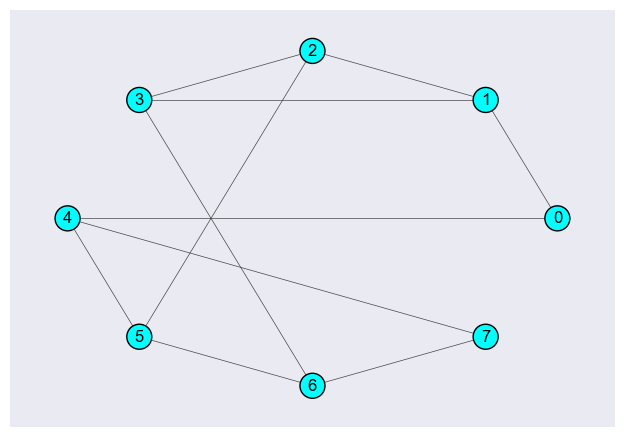

In [6]:
# test fot undirected case:

A_undirect = np.array([[0, 1, 0, 0, 1, 0, 0, 0],  
                       [1, 0, 1, 1, 0, 0, 0, 0],  
                       [0, 1, 0, 1, 0, 1, 0, 0],  
                       [0, 1, 1, 0, 0, 0, 1, 0],  
                       [1, 0, 0, 0, 0, 1, 0, 1],  
                       [0, 0, 1, 0, 1, 0, 1, 0],  
                       [0, 0, 0, 1, 0, 1, 0, 1],  
                       [0, 0, 0, 0, 1, 0, 1, 0]])

g_undirect = ig.Graph.Adjacency(A_undirect, mode="undirected", loops=False)

vertex_label = np.arange(0,A_undirect.shape[0])
color = "cyan"

fig, ax = plt.subplots(figsize=(7,5))
fig.tight_layout(pad=1.5)
ig.plot(g_undirect,vertex_color=color,vertex_label=vertex_label, vertex_size=25, edge_width=0.5, layout="circle", target=ax);

df_undirected=graph_info(A_undirect)
df_undirected

,node,freq,linked_nodes,weights
0,0,0.266657,[6],[1.0]
1,1,0.039567,"[0, 7]","[0.5, 0.5]"
2,2,0.048981,"[1, 5]","[0.5, 0.5]"
3,3,0.035566,[2],[1.0]
4,4,0.271872,[0],[1.0]
5,5,0.039567,"[3, 7]","[0.5, 0.5]"
6,6,0.245408,[4],[1.0]
7,7,0.052382,[4],[1.0]


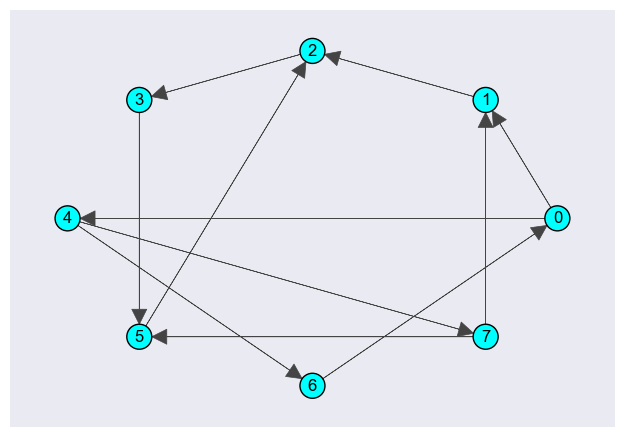

In [7]:
# test for directed case:

A_direct = np.array([[0, 1, 0, 0, 1, 0, 0, 0],  
                    [0, 0, 1, 0, 0, 0, 0, 0],  
                    [0, 0, 0, 1, 0, 0, 0, 0],  
                    [0, 0, 0, 0, 0, 1, 0, 0],  
                    [0, 0, 0, 0, 0, 0, 1, 1],  
                    [0, 0, 1, 0, 0, 0, 0, 0],  
                    [1, 0, 0, 0, 0, 0, 0, 0],  
                    [0, 1, 0, 0, 0, 1, 0, 0]])

g_direct = ig.Graph.Adjacency(A_direct, mode="directed", loops=False)

vertex_label = np.arange(0,A_direct.shape[0])
color = "cyan"

fig, ax = plt.subplots(figsize=(7,5))
fig.tight_layout(pad=1.5)
ig.plot(g_direct,vertex_color=color,vertex_label=vertex_label, vertex_size=25, edge_width=0.5, layout="circle", target=ax);

df_directed=graph_info(A_direct)
df_directed

### 2.2. Evaluate the Map equation

Once we obtain the ergodic visiting frequencies of the nodes, the connections between them, and the weights of these connections, we can proceed to evaluate the Map equation. This requires defining the structure of modules into which the network is partitioned and initializing these modules.

#### 2.2.1. Modules initialization

We construct a module as a matrix $2 \times (n_i+1)$, where $n_i$ is the number of nodes presented in the partition. The first row of the matrix represent the node ID for each node presented in the matrix plus a special one "$-1$" associated to the "exit node" of the partition. The second row contains the associated ergodic frequencies. For computational convenience, the exit node information is stored in the first column of the matrix.

At the beginning of our algorithm, we consider each node of the network as a single partition, so we initialize a module for each node via the $\texttt{initialize}$ _ $\texttt{modules}$ function. All the initial partitions are collected into a dictionary where the key values are the module IDs and the values are the modules matrix.

In [8]:
def initialize_modules(graph_df):
    """
    function that generate a dictionary of matrix corresponding to each network's module
    the initial prartition consider each node in the network as a single module
    
        * 'nodes modules':
            they are named from 0 to n-1 for each of the n nodes in the network
            each module is a matrix where the first row is the list of nodes presented in the module
            the first element of the fist row is '-1' and represent the 'exit node'
            the second row is the list of the frequencies for the stady state of the associated markovian process 

    input:    - grap_df: dataframe, dataframe produced by graph_info()

    output:   - initial_modules: dictionary, dictionary of the starting modules
    """
    node_freq = list(graph_df["freq"])

    initial_modules = {}

    for i,j in enumerate(node_freq):
        initial_modules[i] = np.array([[-1,i],[j,j]])

    return initial_modules


def print_modules(modules):
    """
    auxilary function to visualize modules
    
    input:    - moduels: dictonary
    """ 
    for module_id, module in modules.items():
        print(f"MODULE: {module_id}")
        print(module,"\n")

MODULE: 0
[[-1.          0.        ]
 [ 0.14285714  0.14285714]] 

MODULE: 1
[[-1.          1.        ]
 [ 0.14285714  0.14285714]] 

MODULE: 2
[[-1.          2.        ]
 [ 0.21428571  0.21428571]] 

MODULE: 3
[[-1.          3.        ]
 [ 0.14285714  0.14285714]] 

MODULE: 4
[[-1.          4.        ]
 [ 0.14285714  0.14285714]] 

MODULE: 5
[[-1.          5.        ]
 [ 0.21428571  0.21428571]] 



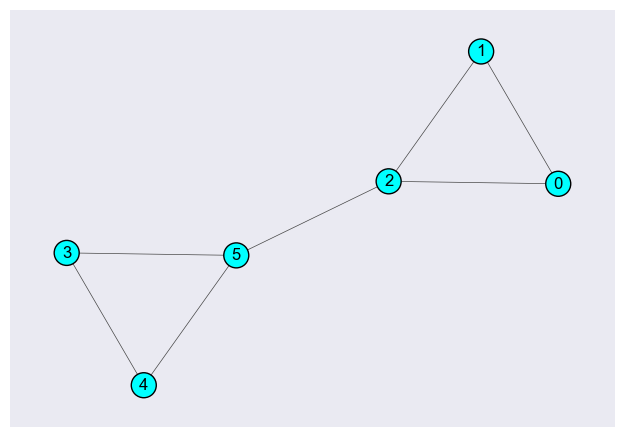

In [9]:
# test the function

g_test = ig.Graph.Adjacency(A, mode="undirected", loops=False)

n = A.shape[0]
vertex_label = np.arange(0,n)
color = "cyan"

fig, ax = plt.subplots(figsize=(7,5))
fig.tight_layout(pad=1.5)
ig.plot(g_test,vertex_color=color,vertex_label=vertex_label, vertex_size=25, edge_width=0.5, target=ax);

graph_df = graph_info(A, pagerank_on=False)

initial_modules = initialize_modules(graph_df)
print_modules(initial_modules)

#### 2.2.2. Map equation

Defined and initialized the modules, a Map equation implementation is quite straightforward.

Using the definition of information entropy, we can expand the formula peresented in the theoretical section as:
$$
L(M) = \left(\sum_{i=1}^m q_{i\curvearrowright}\right)\log\left(\sum_{i=1}^m q_{i\curvearrowright} \right) - 2 \sum_{i=1}^m q_{i\curvearrowright} \log(q_{i\curvearrowright}) - \sum_{\alpha=1}^n p_{\alpha} \log(p_{\alpha}) + \sum_{i=1}^m \left( q_{i\curvearrowright} + \sum_{\alpha \in 1}^n p_{\alpha} \right) \log \left( q_{i\curvearrowright} + \sum_{\alpha \in 1}^n p_{\alpha} \right)
$$
In this expanded form we can note that the term $\sum_{\alpha=1}^n p_{\alpha} \log(p_{\alpha})$ is independent of partitioning, and elsewhere in the expression $p_\alpha$ appears only when summed over all nodes in a module. Consequently, when we optimize the network partition, it is sufficient to keep track of changes in $q_{i\curvearrowright}$, the rate at which a random walker enters and exits each module, and $\sum_{\alpha \in 1}^n p_{\alpha}$, the fraction of time a random walker spends in each module.


In [10]:
def evaluete_map_equation(modules, verbose=False):
    """
    function that evaluets the map equation

    inputs:   - modules: dictionary, dictionary of modules to evaluate
              - verbose: bool, control parameter for debugging

    output:   - bits: float, result of the map equation
    """

    exit_rates = [modules[i][1,0] for i in modules.keys()]
    exit_rates = [0 if i is None else i for i in exit_rates]
    exit_sum = np.sum(exit_rates)

    nodes_rates = [list(modules[i][1,1:]) for i in modules.keys()]
    flatten_nodes_rates = [i for sublist in nodes_rates for i in sublist ]
    exit_and_nodes_rate = [np.sum(modules[i][1,:]) for i in modules.keys()]

    if exit_sum == 0:
        term_1 = 0
        term_2 = 0

    else:
        term_1 = exit_sum * np.log2(exit_sum)

        log_exit_rates = [0 if i == 0 else np.log2(i) for i in exit_rates]
        term_2 = - 2 * np.sum(np.multiply(exit_rates,log_exit_rates))
    
    log_flatten_nodes_rates = [0 if i == 0 else np.log2(i) for i in flatten_nodes_rates]
    term_3 = - np.sum(list(np.multiply(flatten_nodes_rates,log_flatten_nodes_rates)))

    log_exit_and_nodes_rates = [0 if i == 0 else np.log2(i) for i in exit_and_nodes_rate]
    term_4 = + np.sum(list(np.multiply(exit_and_nodes_rate,log_exit_and_nodes_rates)))

    bits = term_1 + term_2 + term_3 + term_4

    if verbose:
        print(f"term 1: {term_1}")
        print(f"term 2: {term_2}")
        print(f"term 3: {term_3}")
        print(f"term 4: {term_4}\n")
        print(f"bits: {np.round(bits,2)}")
        print("------------------------------------------------")

    return bits

As control test we can consider the two partitions prorposed in [3] for the above toy graph in order to see if the Map equation is correctly evaluated. In the case of the single module partition the nuber of bits is should be 2.56, instead for the two modules partitions 2.32.

----



[3] Farage, Carmel, et al. "Identifying flow modules in ecological networks using Infomap."*Methods in Ecology and Evolution* 12.5 (2021): 778-786.

In [11]:
one_module = {0:np.array([[i for i in range(-1,6)],[0,2/14,2/14,3/14,2/14,2/14,3/14]])}
print_modules(one_module)

bits = evaluete_map_equation(one_module,verbose=True)

MODULE: 0
[[-1.          0.          1.          2.          3.          4.
   5.        ]
 [ 0.          0.14285714  0.14285714  0.21428571  0.14285714  0.14285714
   0.21428571]] 

term 1: 0
term 2: 0
term 3: 2.556656707462823
term 4: -1.6017132519074586e-16

bits: 2.56
------------------------------------------------


In [ ]:
one_module = {0:np.array([[i for i in range(-1,6)],[0,2/14,2/14,3/14,2/14,2/14,3/14]])}
print_modules(one_module)

bits = evaluete_map_equation(one_module,verbose=True)

MODULE: 0
[[-1.          0.          1.          2.          3.          4.
   5.        ]
 [ 0.          0.14285714  0.14285714  0.21428571  0.14285714  0.14285714
   0.21428571]] 

term 1: 0
term 2: 0
term 3: 2.556656707462823
term 4: -1.6017132519074586e-16

bits: 2.56
------------------------------------------------


In [12]:
two_modules = {0:np.array([[-1,0,1,2],[1/14,2/14,2/14,3/14]]),1:np.array([[-1,3,4,5],[1/14,2/14,2/14,3/14]])}
print_modules(one_module)

bits = evaluete_map_equation(two_modules,verbose=True)

MODULE: 0
[[-1.          0.          1.          2.          3.          4.
   5.        ]
 [ 0.          0.14285714  0.14285714  0.21428571  0.14285714  0.14285714
   0.21428571]] 

term 1: -0.40105070315108626
term 2: 1.0878156920164583
term 3: 2.556656707462823
term 4: -0.9226913394944047

bits: 2.32
------------------------------------------------


### 2.3. Binary merging algorithm for best partition

The goal of Infomap is to find the best partition of the network according to the minimal value of the Map equation. To achieve this, we implemented a binary merging algorithm that starts from an initial single-node module partition and merges pairs of connected modules to minimize our objective function.

For better code accessibility, we built this algorithm on top of simpler functions:
- $\texttt{initialize}$ _ $\texttt{possible}$ _ $\texttt{links}$ that defines a dictionary of tuples representing possible links and their relative weights between modules.
- $\texttt{merging}$ _ $\texttt{possible}$ _ $\texttt{links}$ that update the links dictionary in such a way we correctly track the connections between new modules and their weights after each merge.


#### 2.3.1. Initialize end merging modules links

The $\texttt{initialize}$ _ $\texttt{possible}$ _ $\texttt{links}$ function uses the dataframe produced by the $\texttt{graph}$ _ $\texttt{info}$ function. This dataframe contains for each node, a list of nodes pointing to it and a list of relative weights. For undirected networks, this information is sufficient since the adjacency matrix is symmetric and the random walker can move freely in both directions of the links. For directed networks, we have two options for binary merging:

- Given a target module, we can merge it with the modules that point to it.
- Given a target module, we can merge it with the modules that the target module points to.

The first case is equivalent to the undirected case, so we can continue using the information stored in the dataframe. 

For the latter case, we implement a $\texttt{move}$ _ $\texttt{out}$ control parameter that considers the connections outgoing from the target node. However, by default, we use the modules pointing to the considered one for merging.
Below we have the implementation for the initializations of the links in the graph.


In [13]:
def initialize_possible_links(graph_df, move_out = False):
    """
    function that initialize a dictionary of possible links between nodes.
    the structure is: {source_node_1: [(end_node_1, edge_weight_1), (end_node_2, edge_weight_2), ...]...}
    
    input:  - graph df: dictionary, dictionary produced by graph_info()
            - move_out: bool, condition for buil the dictionary using the links that go out the module

    output: - possible_links: dictionary, dictionary of connections between modules
    """

    if move_out:
        possible_links = {}
        
        for _, row in graph_df.iterrows():
            end_node = row["node"]
            for source_node, weight in zip(row["linked_nodes"], row["weights"]):
                if source_node not in possible_links:
                    possible_links[source_node] = []
                possible_links[source_node].append((end_node, weight))

            possible_links = {k: possible_links[k] for k in sorted(possible_links)}

        # add nodes with no connections/not pointed by other nodes
        for i in graph_df["node"]:
            if i not in possible_links.keys():
                possible_links[i] = []
    
            possible_links = dict(sorted(possible_links.items()))

    # in this case we initialize the links that go in the target node
    else:
        possible_links = {i: list(zip(graph_df["linked_nodes"][i], graph_df["weights"][i])) for i in range(len(graph_df["linked_nodes"]))}


    return possible_links

0       [1, 4]
1    [0, 2, 3]
2    [1, 3, 5]
3    [1, 2, 6]
4    [0, 5, 7]
5    [2, 4, 6]
6    [3, 5, 7]
7       [4, 6]
Name: linked_nodes, dtype: object 

possible links:

source/ending node: 0 ending/source nodes: [1, 4]
source/ending node: 1 ending/source nodes: [0, 2, 3]
source/ending node: 2 ending/source nodes: [1, 3, 5]
source/ending node: 3 ending/source nodes: [1, 2, 6]
source/ending node: 4 ending/source nodes: [0, 5, 7]
source/ending node: 5 ending/source nodes: [2, 4, 6]
source/ending node: 6 ending/source nodes: [3, 5, 7]
source/ending node: 7 ending/source nodes: [4, 6]


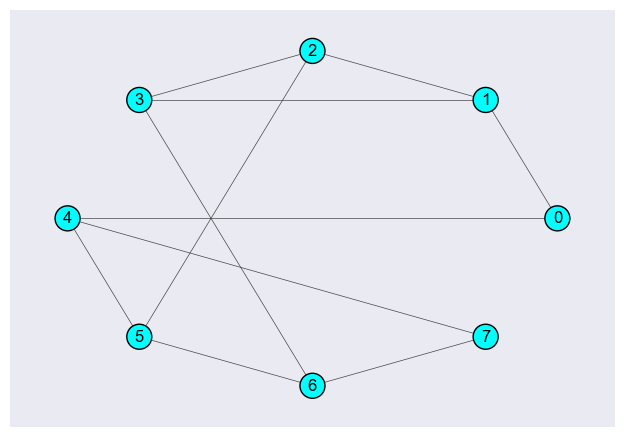

In [14]:
#test for the undirected case:

vertex_label = np.arange(0,A_undirect.shape[0])

fig, ax = plt.subplots(figsize=(7,5))
fig.tight_layout(pad=1.5)
ig.plot(g_undirect,vertex_color=color,vertex_label=vertex_label, vertex_size=25, edge_width=0.5, layout="circle", target=ax);

possible_links_undirected = initialize_possible_links(df_undirected)

print(df_undirected["linked_nodes"],"\n") # just print the linked node connections for visual semplicity
print("possible links:\n")
for source_node, target_node_list in possible_links_undirected.items():
    print("source/ending node:",source_node, "ending/source nodes:", [target_node  for target_node, __ in target_node_list])

0       [6]
1    [0, 7]
2    [1, 5]
3       [2]
4       [0]
5    [3, 7]
6       [4]
7       [4]
Name: linked_nodes, dtype: object 

move_out=True 

source node: 0 ending nodes: [1, 4]
source node: 1 ending nodes: [2]
source node: 2 ending nodes: [3]
source node: 3 ending nodes: [5]
source node: 4 ending nodes: [6, 7]
source node: 5 ending nodes: [2]
source node: 6 ending nodes: [0]
source node: 7 ending nodes: [1, 5]

move_out=False 

end node: 0 source nodes: [6]
end node: 1 source nodes: [0, 7]
end node: 2 source nodes: [1, 5]
end node: 3 source nodes: [2]
end node: 4 source nodes: [0]
end node: 5 source nodes: [3, 7]
end node: 6 source nodes: [4]
end node: 7 source nodes: [4]


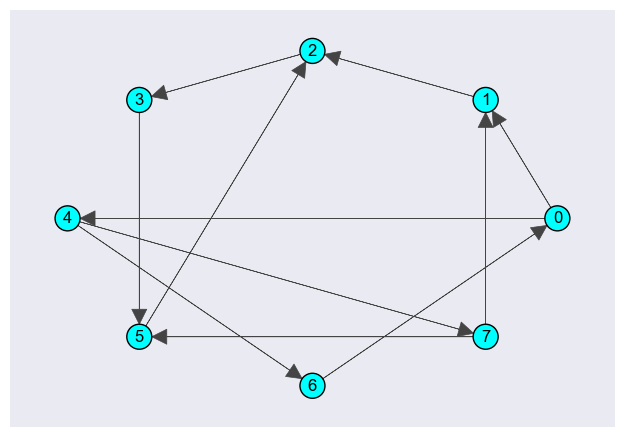

In [15]:
#test for the directed case:

vertex_label = np.arange(0,A_direct.shape[0])

fig, ax = plt.subplots(figsize=(7,5))
fig.tight_layout(pad=1.5)
ig.plot(g_direct,vertex_color=color,vertex_label=vertex_label, vertex_size=25, edge_width=0.5, layout="circle", target=ax);

print(df_directed["linked_nodes"],"\n")

possible_links_directed = initialize_possible_links(df_directed, move_out=True)
print("move_out=True \n")
for source_node, target_node_list in possible_links_directed.items():
    print("source node:",source_node, "ending nodes:", [target_node  for target_node, __ in target_node_list])

print()

possible_links_directed = initialize_possible_links(df_directed, move_out=False)
print("move_out=False \n")
for source_node, target_node_list in possible_links_directed.items():
    print("end node:",source_node, "source nodes:", [target_node  for target_node, __ in target_node_list])


As robustness test for the function, we consider also a limit case when our graph is directed and has one or more disconnected node:

0          [9]
1          [4]
2           []
3           []
4          [3]
5          [1]
6           []
7          [3]
8    [0, 4, 7]
9           []
Name: linked_nodes, dtype: object 

move_out=True 

source node: 0 ending nodes: [8]
source node: 1 ending nodes: [5]
source node: 2 ending nodes: []
source node: 3 ending nodes: [4, 7]
source node: 4 ending nodes: [1, 8]
source node: 5 ending nodes: []
source node: 6 ending nodes: []
source node: 7 ending nodes: [8]
source node: 8 ending nodes: []
source node: 9 ending nodes: [0]

move_out=False 

end node: 0 source nodes: [9]
end node: 1 source nodes: [4]
end node: 2 source nodes: []
end node: 3 source nodes: []
end node: 4 source nodes: [3]
end node: 5 source nodes: [1]
end node: 6 source nodes: []
end node: 7 source nodes: [3]
end node: 8 source nodes: [0, 4, 7]
end node: 9 source nodes: []


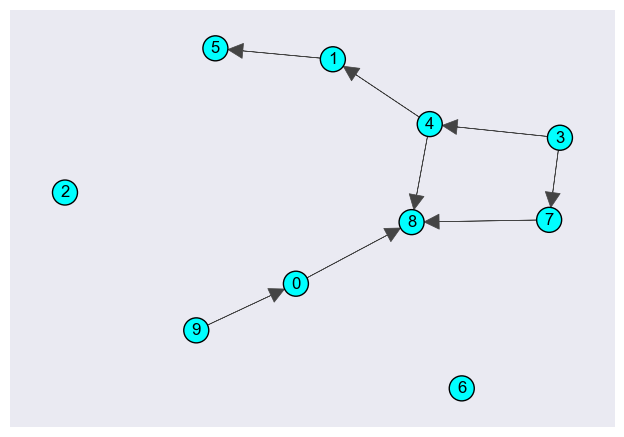

In [16]:
#test for the limit case:

random.seed(10)

# nodes:
n = 10 
# edges:       
m = 8

g_erdos = ig.Graph.Erdos_Renyi(n=n, m=m, directed=True, loops=False)
A_erdos = ig.Graph.get_adjacency(g_erdos)

vertex_label = np.arange(0,n)
df_erdos=graph_info(A_erdos)

fig, ax = plt.subplots(figsize=(7,5))
fig.tight_layout(pad=1.5)
ig.plot(g_erdos,vertex_color=color,vertex_label=vertex_label, vertex_size=25, edge_width=0.5, target=ax);

print(df_erdos["linked_nodes"],"\n")

possible_links_erdos = initialize_possible_links(df_erdos, move_out=True)
print("move_out=True \n")
for source_node, target_node_list in possible_links_erdos.items():
    print("source node:",source_node, "ending nodes:", [target_node  for target_node, __ in target_node_list])

print()

possible_links_erdos = initialize_possible_links(df_erdos, move_out=False)
print("move_out=False \n")
for source_node, target_node_list in possible_links_erdos.items():
    print("end node:",source_node, "source nodes:", [target_node  for target_node, __ in target_node_list])

Having the dictionary of initial possible links, we can now implement the $\texttt{merging}$ _ $\texttt{possible}$ _ $\texttt{links}$ function that updates the connections between modules and their relative weights after merging two of them.

The function first ensures that the two considered modules are actually connected. If the modules are not connected, it raises an error to prevent invalid merging attempts. 

Once the connectivity is confirmed, the function creates a new dictionary to sum the weights of the combined links. This step is crucial as it ensures that if there are multiple links to the same node, their weights are aggregated correctly, preserving the network's structural integrity.

For each node connected to the combined module, the function updates the reciprocal links. This means adjusting the weights of the links to reflect the newly merged state of the modules. If normalization is required, the weights are adjusted to maintain proportionality.

After merging, any self-connections within the considered module are removed. Self-connections do not contribute to the network's overall structure and can lead to redundant or incorrect calculations. Removing these ensures the merged module's connections are clean and accurate.

The merged module is then removed from the dictionary of possible links. 

Finally, the links for each module are sorted by their connected module IDs. Sorting ensures that the link data is consistent and easier to handle in subsequent steps, such as further merging operations or evaluations of the network's modularity. This ordered structure aids in maintaining clarity and efficiency in the overall algorithm.


In [17]:
def merging_possible_links(possible_links, target_id, merging_id, normalization=False):
    """
    Function that produces a dictionary of possible links between modules after the merging.
    
    Inputs: 
        - possible_links: dictionary, dictionary of possible links from the module
        - target_id: int, the target module ID
        - merging_id: int, the module ID to be merged
        - normalization: boolean, flag to indicate if weights should be normalized

    Output: 
        - new_possible_links: dictionary, updated possible links after merging
    """
    
    # check if merging_id is reachable from target_id
    if merging_id not in [node for node, _ in possible_links[target_id]]:
        raise ValueError("Merging module unreachable from target module")
    
    new_possible_links = copy.deepcopy(possible_links)
    
    # get the links for target_id and merging_id
    target_links = new_possible_links[target_id]
    merging_links = new_possible_links[merging_id]

    # create a dictionary to sum weights for combined links
    combined_links = {}
    for node, weight in target_links + merging_links:
        if node != target_id and node != merging_id:
            if node in combined_links:
                combined_links[node] += weight
            else:
                combined_links[node] = weight

    if normalization:
        # normalize the weights for target_id
        total_weight = sum(combined_links.values())
        if total_weight > 0:
            combined_links = {node: weight / total_weight for node, weight in combined_links.items()}

    # update the links for target_id with combined  weights
    new_possible_links[target_id] = [(node, weight) for node, weight in combined_links.items()]

    # update the reciprocal links and normalize if needed
    for node, weight in combined_links.items():
        new_links = []
        merged_weight = 0
        for linked_node, linked_weight in new_possible_links[node]:
            if linked_node == merging_id or linked_node == target_id:
                merged_weight += linked_weight
            else:
                new_links.append((linked_node, linked_weight))

        if normalization:
            if merged_weight > 0:
                total_linked_weight = sum(w for n, w in new_possible_links[node] if n != target_id and n != merging_id)
                total_linked_weight += merged_weight
                if total_linked_weight > 0:
                    new_links.append((target_id, merged_weight / total_linked_weight))
            else:
                new_links.append((target_id, weight))
        else:
            if merged_weight > 0:
                new_links.append((target_id, merged_weight))
            else:
                new_links.append((target_id, weight))

        # normalize the weights for reciprocal links if needed
        if normalization:
            total_weight_node = sum(w for _, w in new_links)
            if total_weight_node > 0:
                new_links = [(n, w / total_weight_node) for n, w in new_links]

        new_possible_links[node] = new_links

    # remove self connections for target_id
    new_possible_links[target_id] = [item for item in new_possible_links[target_id] if item[0] != target_id]

    # replace references to merging_id with target_id in all nodes
    for node, links in new_possible_links.items():
        updated_links = []
        for linked_node, weight in links:
            if linked_node == merging_id:
                linked_node = target_id
            updated_links.append((linked_node, weight))
        new_possible_links[node] = updated_links

    # remove the merged module id from the dictionary
    new_possible_links.pop(merging_id)

    # sort the links for each node by the link id
    for node in new_possible_links:
        new_possible_links[node] = sorted(new_possible_links[node], key=lambda x: x[0])

    return new_possible_links


In [18]:
# testing the function:

print("undirected case:")
print(f" target id: \t{0}\n merge_id: \t{1}\n {merging_possible_links(possible_links_undirected,0,1)}\n")

print("directed case (move_out=False):")
print(f" target id: \t{1}\n merge_id: \t{0}\n {merging_possible_links(possible_links_directed,1,0)}\n")

print("limit case (move_out=False):")
print(f" target id: \t{8}\n merge_id: \t{0}\n {merging_possible_links(possible_links_erdos,8,0)}\n")


undirected case:
 target id: 	0
 merge_id: 	1
 {0: [(2, 0.3333333333333333), (3, 0.3333333333333333), (4, 0.5)], 2: [(0, 0.3333333333333333), (3, 0.3333333333333333), (5, 0.3333333333333333)], 3: [(0, 0.3333333333333333), (2, 0.3333333333333333), (6, 0.3333333333333333)], 4: [(0, 0.3333333333333333), (5, 0.3333333333333333), (7, 0.3333333333333333)], 5: [(2, 0.3333333333333333), (4, 0.3333333333333333), (6, 0.3333333333333333)], 6: [(3, 0.3333333333333333), (5, 0.3333333333333333), (7, 0.3333333333333333)], 7: [(4, 0.5), (6, 0.5)]}

directed case (move_out=False):
 target id: 	1
 merge_id: 	0
 {1: [(6, 1.0), (7, 0.5)], 2: [(1, 0.5), (5, 0.5)], 3: [(2, 1.0)], 4: [(1, 1.0)], 5: [(3, 0.5), (7, 0.5)], 6: [(1, 1.0), (4, 1.0)], 7: [(1, 0.5), (4, 1.0)]}

limit case (move_out=False):
 target id: 	8
 merge_id: 	0
 {1: [(4, 1.0)], 2: [], 3: [], 4: [(3, 1.0), (8, 0.3333333333333333)], 5: [(1, 1.0)], 6: [], 7: [(3, 1.0), (8, 0.3333333333333333)], 8: [(4, 0.3333333333333333), (7, 0.3333333333333333

#### 2.3.2. Merging modules

At this point, we have all the necessary components to implement a function merges pairs of network modules to minimize the value of the Map equation given a target module ID: the $\texttt{merging}$ _ $\texttt{module}$ function.

Upon receiving the possible links in the network as input (if not provided, the initial possible links are automatically initialized), the function creates a deep copy of the modules dictionary. This copy, $\texttt{best}$ _ $\texttt{modules}$, will store the best partition found so far. It also evaluates the initial Map equation value for these modules and stores this value as $\texttt{best}$ _ $\texttt{evaluation}$.

The function then enters a loop where it considers each module that is connected to the target module for merging and:
- Verifies that the connection between the target module and the merging candidate actually exists.
- Updates the links and weights in the network according to the proposed merge by making a copy of the possible links dictionary.
- Merges the node and frequency lists of the two modules and sorts them according to the node IDs.
- Updates the "exit node" for the new module:
    - if using the Pagerank algorithm, the exit probability is determined by the dumping factor $d$ as:
        $$
        q_{i\curvearrowright}=(1-d)\frac{n-n_i}{n}\sum_{\alpha \in i}p_\alpha + d \sum_{\alpha \in i}\sum_{\beta \notin i}p_\alpha w_{\alpha\beta}
        $$
    - if using relative weights, the exit probability is determined just by the number of exiting links and their weights.

- Evaluates the Map equation for the newrly merged modules. If this new evaluation is better (lower) than the current best, it updates $\texttt{best}$ _ $\texttt{modules}$, $\texttt{best}$ _ $\texttt{evaluation}$.

After the algorithm has found the best merging combination for the target module, the possible links are updated, and all references to the module that has been merged are replaced with references to the new module.

In [19]:
def merge_modules(modules, possible_links, target_module, graph_df, 
                  pagerank_on=True, 
                  d=0.85, 
                  normalize_weights_after_merging=False,
                  move_out=False,
                  verbose=False):
    """

    """
    
    if not possible_links:
        possible_links = initialize_possible_links(graph_df, move_out=move_out)

    best_modules = copy.deepcopy(modules)
    best_evaluation = evaluete_map_equation(best_modules)
    best_linked_module = None
    new_possible_links = None

    N_nodes = len(graph_df["node"])
    total_links = np.sum([len(links) for links in possible_links.values()])
    total_weights = np.sum([np.sum(i) for i in df_directed["weights"]])

    if verbose:
        print(f"target module: {target_module}")
        print(f"possible links: {possible_links[target_module]}\n")

    if possible_links[target_module]:
        for merge_id, _ in possible_links[target_module]:
            current_possible_links = merging_possible_links(possible_links, target_module, merge_id, normalize_weights_after_merging)
            current_modules = copy.deepcopy(modules)

            # merging freqs
            new_node_list = list(modules[target_module][0]) + list(modules[merge_id][0][1:])
            new_frq_list = list(modules[target_module][1]) + list(modules[merge_id][1][1:])

            current_modules[target_module] = np.array([new_node_list, new_frq_list])

            # ordering the matrix according to the nodes name
            sorted_indices = np.argsort(current_modules[target_module][0])
            current_modules[target_module] = current_modules[target_module][:, sorted_indices]

            # update the exit rate
            modules_weights = [weight for __, weight in current_possible_links[target_module]]  

            if pagerank_on:
                N_module = len(current_modules[target_module][0]) - 1

                modules_freqs = new_frq_list[1:]
                weighted_freqs = [freq*weight for freq,weight in zip(modules_freqs,modules_weights)]

                current_modules[target_module][1, 0] = (1 - d) * (N_nodes - N_module) / (N_nodes-1) * np.sum(modules_freqs) + \
                                                        d * np.sum(weighted_freqs)
            else:
                exit_freqs = [1/total_links]*len(current_possible_links[target_module])
                weighted_freqs = [freq*weight/total_weights for freq,weight in zip(exit_freqs,modules_weights)] ###
                current_modules[target_module][1, 0] = np.sum(weighted_freqs)
                

            del current_modules[merge_id]

            evaluation = evaluete_map_equation(current_modules)

            if verbose:
                print(f"merge id: {merge_id}, bits: {evaluation}")
        
            if evaluation < best_evaluation:
                best_modules = current_modules
                best_evaluation = evaluation 
                best_linked_module = merge_id
                new_possible_links = current_possible_links 

        if best_linked_module is not None:
            if best_linked_module not in [node for node, _ in current_possible_links[target_module]]:
                current_possible_links[target_module].append((best_linked_module, 0))
                current_possible_links[target_module] = sorted(current_possible_links[target_module], key=lambda x: x[0])

            for key, value_list in current_possible_links.items():
                if best_linked_module in [node for node, _ in value_list]:
                    if target_module not in [node for node, _ in value_list]:
                        index = [node for node, _ in value_list].index(best_linked_module)
                        value_list[index] = (target_module, value_list[index][1])
                    else:
                        value_list = [(node, weight) for node, weight in value_list if node != best_linked_module]
                current_possible_links[key] = value_list
        else:
            if verbose:
                print(f"No suitable module found to merge with {target_module}\n")

    if verbose:                   
        print()         
        print(f"{best_linked_module} have been merged to {target_module}\n") 
    
    return best_modules, new_possible_links


In [20]:
# testing the function:

print(graph_df)
print()
possible_links = initialize_possible_links(graph_df)
best_modules,new_possible_links = merge_modules(initial_modules, possible_links, 0, graph_df, verbose=True)


   node      freq linked_nodes  \
0     0  0.142857       [1, 2]   
1     1  0.142857       [0, 2]   
2     2  0.214286    [0, 1, 5]   
3     3  0.142857       [4, 5]   
4     4  0.142857       [3, 5]   
5     5  0.214286    [2, 3, 4]   

                                             weights  
0                                         [0.5, 0.5]  
1                                         [0.5, 0.5]  
2  [0.3333333333333333, 0.3333333333333333, 0.333...  
3                                         [0.5, 0.5]  
4                                         [0.5, 0.5]  
5  [0.3333333333333333, 0.3333333333333333, 0.333...  

target module: 0
possible links: [(1, 0.5), (2, 0.5)]

merge id: 1, bits: 4.125230780381977
merge id: 2, bits: 4.109904816617346

2 have been merged to 0



### 2.4. Infomap partitioning algorithm and visualization

All the previous functions are wrapped in the $\texttt{iterative}$ _ $\texttt{infomap}$ _ $\texttt{partitioning}$ function to apply the binary merge to all nodes in the network. This function is the core of our Infomap implementation. In addition to the adjacency matrix and the setting parameters, the function can also take the $\texttt{modules}$ and the $\texttt{possible}$ _ $\texttt{links}$ dictionary as input. This allows us to build on top of this another function that iteratively applies the algorithm to the network multiple times so that after each application, the subsequent one starts from the modules and possible links obtained previously.

In [21]:
def iterative_infomap_partitioning (modules, possible_links, adjacent_matrix, 
                                    pagerank_on=True, 
                                    d=0.85, 
                                    tol=1e-10, 
                                    shuffle=False, 
                                    normalize_weights=True, 
                                    normalize_weights_after_merging=False,
                                    move_out=False,
                                    verbose=False): 
    
    """

    """
    graph_df = graph_info(adjacent_matrix, pagerank_on, d, tol, normalize_weights)

    if modules is None:
        modules = initialize_modules(graph_df)

    current_modules = copy.deepcopy(modules)
    modules_list = list(modules.keys())

    if shuffle:
        if verbose:
            print(f"Before shuffling: {modules_list}")
        random.shuffle(modules_list)
        #graph_df["num_linked_nodes"] = graph_df["linked_nodes"].apply(len)
        #modules_list = list(graph_df.sort_values(by="num_linked_nodes")["node"])
        if verbose:
            print(f"After shuffling: {modules_list}\n")

    for id in modules_list:
        if id in current_modules.keys():

            current_possible_links = copy.deepcopy(possible_links)
            
            if possible_links is not None: 
                for i, j_list in current_possible_links.items(): 
                    if j_list is not None:
                        current_possible_links[i] = [j for j in j_list if j[0] != i]

            if verbose:
                print(f"current possible links in input: {current_possible_links}")
            
            current_modules, current_possible_links = merge_modules(current_modules, possible_links, id, 
                                                                    graph_df, 
                                                                    pagerank_on=pagerank_on,
                                                                    d=d,
                                                                    normalize_weights_after_merging=normalize_weights_after_merging, 
                                                                    move_out=move_out,
                                                                    verbose=verbose)
            
            if current_possible_links is not None:
                possible_links = current_possible_links
                
            if verbose:
                print_modules(current_modules)
                print("-----------------------------------------------------------------------------------------------------------------------")

    new_modules_name = list(np.arange(len(current_modules)))
    old_modules_name = list(current_modules.keys())
    correspondance_list = []

    for i, j in enumerate(old_modules_name):
        correspondance_list.append(tuple([j, i]))

    final_modules = new_modules_name
    new_keys = new_modules_name 

    best_modules = {}
    for new_key, value in zip(new_keys, current_modules.values()):
        best_modules[new_key] = value

    if possible_links is not None:
        for i, j_list in possible_links.items():
            possible_links[i] = [j for j in j_list if j[0] != i]

        final_links = {}    
        for key, value in possible_links.items():
            new_key = next(new_key for old_key, new_key in correspondance_list if old_key == key)
            new_value = [(next(new_key for old_key, new_key in correspondance_list if old_key == v), w) for v, w in value]
            final_links[new_key] = sorted(new_value, key=lambda x: x[0])

    final_partition = {}
    for i in final_modules:
        final_partition[i] = [int(i) for i in np.sort(list(best_modules[i][0])[1:])]

    return best_modules, final_links, final_partition


The $\texttt{community}$ _ $\texttt{partitioning}$ function finally implements the Infomap algorithm in a iterative way.

The input parametes are:

- $\texttt{adjacency}$ _ $\texttt{matrix}$ (2D array): The adjacency matrix representing the network's structure.
- $\texttt{pagerank}$ _ $\texttt{on}$ (bool, default=True): If True, uses the PageRank algorithm to calculate exit probabilities. Otherwise, relative weights are used.
- $\texttt{d}$ (float, default=0.85): The damping factor for the PageRank algorithm.
- $\texttt{tol}$ (float, default=1e-10): Tolerance level for convergence in the PageRank calculation.
- $\texttt{iterations}$ (int, default=2): The number of iterations to run the Infomap algorithm.
- $\texttt{shuffle}$ (bool, default=False): If True, shuffles the modules before each iteration to potentially improve results.
- $\texttt{normalize}$ _ $\texttt{weights}$ (bool, default=True): If True, normalizes the weights during initialization.
- $\texttt{normalize}$ _ $\texttt{weights}$ _ $\texttt{after}$ _ $\texttt{merging}$ (bool, default=False): If True, normalizes weights after each merge.
- $\texttt{verbose}$ (bool, default=False): If True, prints detailed information during the process.

The function returns:

- $\texttt{best}$ _ $\texttt{modules}$ (dict): Dictionary of the best modules according to the Map equation.
- $\texttt{final}$ _ $\texttt{links}$ (dict): Dictionary of the connections between the best modules.
- $\texttt{final}$ _ $\texttt{partition}$ (dict): Dictionary of partitioned nodes.

In [22]:
def community_partitioning(adjacency_matrix, 
                           pagerank_on=True, 
                           d=0.85, 
                           tol=1e-10, 
                           iterations=2, 
                           shuffle=False, 
                           normalize_weights=True,
                           normalize_weights_after_merging=False,
                           move_out=False,
                           verbose=False):
    
    # method that implements the infomap
    #
    # input:    - graph: igraph graph
    #           - iterations: int, number of time the algoritm will be executed
    #           - verbose: bool, if True prints the final modules
    #           - detailed_verbose: bool, if True prints the details of the merging process
    # outputs:  - best_modules: dictionary of the best modules according to the map equation
    #           - final_links: dictionary of the connection between the best modules
    #           - final_partition: dictionary of partitioned nodes

    best_modules = None
    final_links = None
    final_partition = None

    # we remove self interaction from the matrix because they do not contribute for the partitioning
    adjacency_matrix = np.array(adjacency_matrix)
    np.fill_diagonal(adjacency_matrix,0)

    if verbose:
        print("=======================================================================================================================")
        graph_df=graph_info(adjacency_matrix)           
        print(graph_df,"\n")
        print("# Nodes connections:")
        print(initialize_possible_links(graph_df,move_out=move_out))
        print("=======================================================================================================================")
        
        for i in range(iterations):
            print(f"** Iteration: {i} **\n")

            current_modules = copy.deepcopy(best_modules)
            current_links = copy.deepcopy(final_links)
            current_partition = copy.deepcopy(final_partition)

            current_modules, current_links, current_partition = iterative_infomap_partitioning(modules=current_modules,
                                                                                                possible_links=current_links, 
                                                                                                adjacent_matrix=adjacency_matrix,
                                                                                                pagerank_on=pagerank_on,
                                                                                                d=d,
                                                                                                tol=tol,
                                                                                                shuffle=shuffle,
                                                                                                normalize_weights=normalize_weights,
                                                                                                normalize_weights_after_merging=normalize_weights_after_merging,
                                                                                                move_out=move_out,
                                                                                                verbose=verbose)

            best_modules = current_modules
            final_links = current_links 
            final_partition = current_partition 
            print("=======================================================================================================================")

        print(f"Done! Number of partitions: {len(final_partition.keys())}")

        return best_modules, final_links, final_partition

    else:
        for i in tqdm(range(iterations), desc="Partitioning the network", ascii=False, ncols=75):
            if verbose:
                print(f"** Iteration: {i} **\n")

            current_modules = copy.deepcopy(best_modules)
            current_links = copy.deepcopy(final_links)
            current_partition = copy.deepcopy(final_partition)


            current_modules, current_links, current_partition = iterative_infomap_partitioning(modules=current_modules,
                                                                                                possible_links=current_links, 
                                                                                                adjacent_matrix=adjacency_matrix,
                                                                                                pagerank_on=pagerank_on,
                                                                                                d=d,
                                                                                                tol=tol,
                                                                                                shuffle=shuffle,
                                                                                                normalize_weights=normalize_weights,
                                                                                                normalize_weights_after_merging=normalize_weights_after_merging,
                                                                                                move_out=move_out,                                                                                                
                                                                                                verbose=verbose)
            best_modules = current_modules
            final_links = current_links 
            final_partition = current_partition 

            time.sleep(0.02)

        print(f"Done! Number of partitions: {len(final_partition.keys())}")

        return best_modules, final_links, final_partition

We also implement a function that visualize the partite network given a dictionary of partitions.

In [23]:
def plot_graph_with_partitions(graph, partitions, layout, edge_width = 0.5, vertex_label = None, vertex_size = 25, plot_size = (7,5), colour_map = "tab10", title = ""):
    # Auxialiary function that plots the graph using different colors for nodes that are in different partitions.
    #
    # inputs:   - graph: i graph graph
    #           - partitions: dictionary of partitioed nodes
    #           - color_map: string, colours that will be used for the visualization
    #           - title: string, title of the plot
    # output:   - plot of the graph 
    
    n = len(graph.vs)

    if vertex_label is None:       
        vertex_label = [i for i in range(n)]

    vertex_colors = [None] * n

    cmap = plt.get_cmap(colour_map)

    for partition, nodes in partitions.items():
        color = cmap(partition % 10)  
        for node in nodes:
            vertex_colors[node] = color

    fig, ax = plt.subplots(figsize=plot_size)
    fig.tight_layout(pad=1.5)
    ig.plot(graph, layout=layout, 
            vertex_color=vertex_colors, 
            vertex_label=vertex_label, 
            vertex_size=vertex_size, 
            edge_width=edge_width, 
            target=ax)
    fig.suptitle(title,size=12)
    plt.show()

## 3. Test the algorithm

Our implementation of the Infomap algorithm is ecapsuled in the $\texttt{Iterative}$ _ $\texttt{InfoMap}$ _ $\texttt{Class}$, a class that provieds as methods the functions:
- $\texttt{community}$ _ $\texttt{partitioning}$
- $\texttt{visualize}$ _ $\texttt{partition}$
- $\texttt{graph}$ _ $\texttt{info}$
- $\texttt{map}$ _ $\texttt{equation}$
- $\texttt{print}$ _ $\texttt{modules}$

We now proceed to test the class on simple toy networks for undirected and directed mono-layer networks both in unweighted and weighted cases. After that we will test it on more large networks built on real data.

In [24]:
%load_ext autoreload
%autoreload 2

from Iterative_InfoMap_Class import Infomap 
im = Infomap()



# functions that creates a dictionary with the igraph infomap partitions
def built_in_check(graph):
    infomap_partition = ig.Graph.community_infomap(graph)
    map_equation_value = infomap_partition.codelength

    infomap_partition_dict = {}
    for i in range(len(infomap_partition)):
        infomap_partition_dict[i]=infomap_partition[i]

    return infomap_partition_dict, map_equation_value

### 3.1. Simple undirected networks

#### 3.1.1 Undirected and unweighted graph 1

,node,freq,linked_nodes,weights
0,0,0.142857,"[1, 2]","[0.5, 0.5]"
1,1,0.142857,"[0, 2]","[0.5, 0.5]"
2,2,0.214286,"[0, 1, 5]","[0.3333333333333333, 0.3333333333333333, 0.333..."
3,3,0.142857,"[4, 5]","[0.5, 0.5]"
4,4,0.142857,"[3, 5]","[0.5, 0.5]"
5,5,0.214286,"[2, 3, 4]","[0.3333333333333333, 0.3333333333333333, 0.333..."


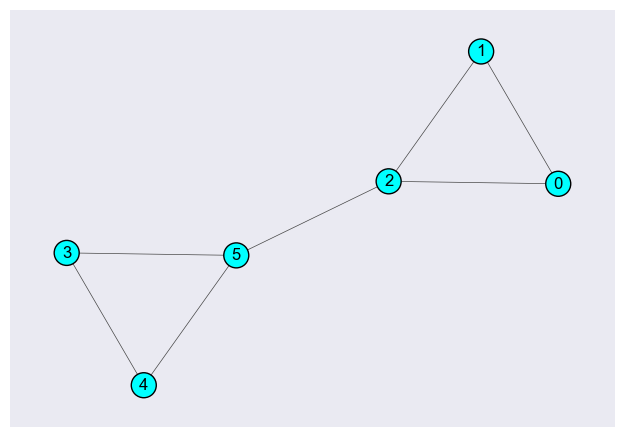

In [25]:
uA_1 = np.array([[0,1,1,0,0,0],
                [1,0,1,0,0,0],
                [1,1,0,0,0,1],
                [0,0,0,0,1,1],
                [0,0,0,1,0,1],
                [0,0,1,1,1,0]])

g_utest_1 = ig.Graph.Adjacency(uA_1, mode="undirected", loops=False)

vertex_label = np.arange(0,uA_1.shape[0])
color = "cyan"

fig, ax = plt.subplots(figsize=(7,5))
fig.tight_layout(pad=1.5)
ig.plot(g_utest_1,vertex_color=color,vertex_label=vertex_label, vertex_size=25, edge_width=0.5, target=ax); 

df_utest_1=im.graph_info(uA_1, pagerank_on=False)
df_utest_1

Partitioning the network: 100%|██████████████| 1/1 [00:00<00:00, 36.47it/s]

Done! Number of partitions: 2

Map equation value (implemented Infomap): 	1.6776320251621357
Map equation value (built-in Infomap): 		2.5178731032222803

Rateo: 						1.5008494505694352
Difference: 					0.8402410780601446


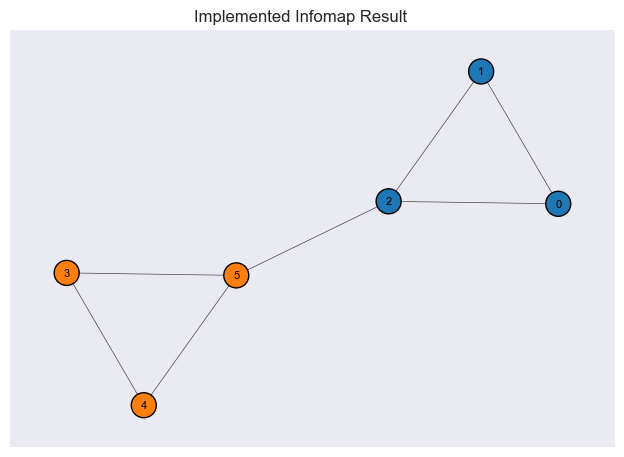

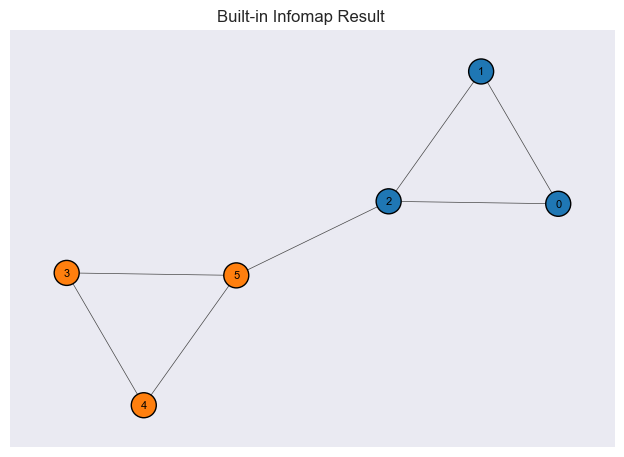

In [26]:
best_modules_utest_1, final_links_utest_1, final_partition_utest_1 = im.community_partitioning(adjacency_matrix=uA_1, 
                                                                    pagerank_on=False,
                                                                    d=0.85, 
                                                                    tol=1e-10, 
                                                                    iterations=1, 
                                                                    shuffle=False,
                                                                    normalize_weights=True,
                                                                    normalize_weights_after_merging=False,
                                                                    verbose=False)  

infomap_value = im.map_equation(best_modules_utest_1)

# check with the built-in function:
infomap_partition_test_1, infomap_codelength = built_in_check(g_utest_1)

alpha_utest_1 = infomap_codelength/infomap_value
delta_utest_1 = infomap_codelength - infomap_value

print(f"\nMap equation value (implemented Infomap): \t{infomap_value}")
print(f"Map equation value (built-in Infomap): \t\t{infomap_codelength}")

print(f"\nRateo: \t\t\t\t\t\t{alpha_utest_1}")
print(f"Difference: \t\t\t\t\t{delta_utest_1}")


im.visualize_partitions(g_utest_1,final_partition_utest_1,layout="auto", title="Implemented Infomap Result")
im.visualize_partitions(g_utest_1,infomap_partition_test_1,layout="auto",title="Built-in Infomap Result")


#### 3.1.2. Undirected and unweighted graph 2

,node,freq,linked_nodes,weights
0,0,0.095227,"[1, 2]","[0.5, 0.5]"
1,1,0.095227,"[0, 2]","[0.5, 0.5]"
2,2,0.134431,"[0, 1, 5]","[0.3333333333333333, 0.3333333333333333, 0.333..."
3,3,0.090310,"[4, 5]","[0.5, 0.5]"
4,4,0.129959,"[3, 5, 6]","[0.3333333333333333, 0.3333333333333333, 0.333..."
5,5,0.129959,"[2, 3, 4]","[0.3333333333333333, 0.3333333333333333, 0.333..."
6,6,0.134431,"[4, 7, 8]","[0.3333333333333333, 0.3333333333333333, 0.333..."
7,7,0.095227,"[6, 8]","[0.5, 0.5]"
8,8,0.095227,"[6, 7]","[0.5, 0.5]"


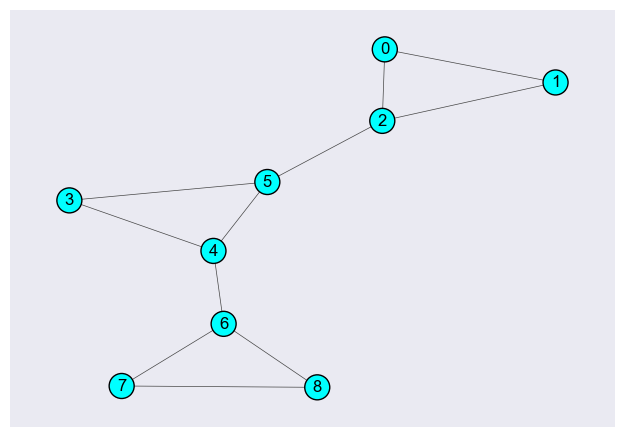

In [27]:
uA_2=np.array([[0,1,1,0,0,0,0,0,0],
            [1,0,1,0,0,0,0,0,0],
            [1,1,0,0,0,1,0,0,0],
            [0,0,0,0,1,1,0,0,0],
            [0,0,0,1,0,1,1,0,0],
            [0,0,1,1,1,0,0,0,0],
            [0,0,0,0,1,0,0,1,1],
            [0,0,0,0,0,0,1,0,1],
            [0,0,0,0,0,0,1,1,0]])

g_utest_2=ig.Graph.Adjacency(uA_2, mode="undirected", loops=False)

vertex_label = np.arange(0,uA_2.shape[0])
color = "cyan"

fig, ax = plt.subplots(figsize=(7,5))
fig.tight_layout(pad=1.5)
ig.plot(g_utest_2,vertex_color=color,vertex_label=vertex_label, vertex_size=25, edge_width=0.5, target=ax);

df_utest_2=im.graph_info(uA_2)
df_utest_2

Partitioning the network: 100%|██████████████| 1/1 [00:00<00:00, 35.73it/s]

Done! Number of partitions: 3

Map equation value (implemented Infomap): 	1.6709166600351044
Map equation value (built-in Infomap): 		2.850535183637665

Rateo: 						1.7059708911979954
Difference: 					1.1796185236025605


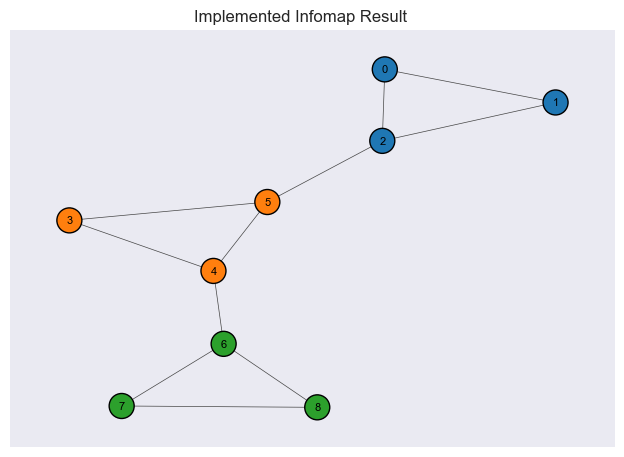

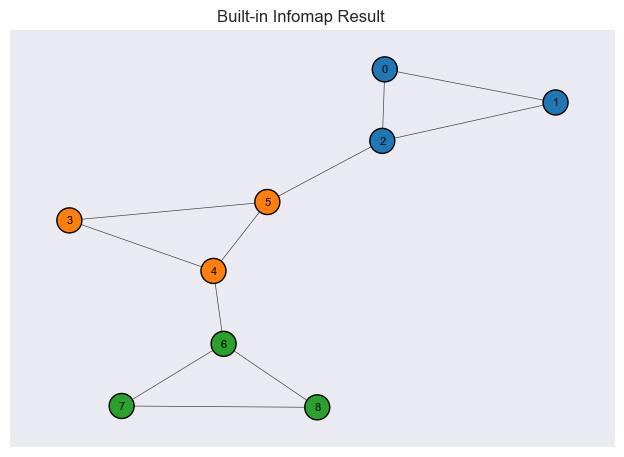

In [28]:
best_modules_utest_2, final_links_utest_2, final_partition_utest_2 = im.community_partitioning(adjacency_matrix=uA_2, 
                                                                    pagerank_on=False,
                                                                    d=0.85, 
                                                                    tol=1e-10, 
                                                                    iterations=1, 
                                                                    shuffle=False,
                                                                    normalize_weights=True,
                                                                    normalize_weights_after_merging=False,
                                                                    verbose=False)  

infomap_value = im.map_equation(best_modules_utest_2)

# check with the built-in function:
infomap_partition_test_2, infomap_codelength = built_in_check(g_utest_2)

alpha_utest_2 = infomap_codelength/infomap_value
delta_utest_2 = infomap_codelength - infomap_value

print(f"\nMap equation value (implemented Infomap): \t{infomap_value}")
print(f"Map equation value (built-in Infomap): \t\t{infomap_codelength}")

print(f"\nRateo: \t\t\t\t\t\t{alpha_utest_2}")
print(f"Difference: \t\t\t\t\t{delta_utest_2}")


im.visualize_partitions(g_utest_2,final_partition_utest_2,layout="auto", title="Implemented Infomap Result")
im.visualize_partitions(g_utest_2,infomap_partition_test_2,layout="auto",title="Built-in Infomap Result")

#### 3.1.3. Undirected and weighted graph

[[0 2 0 4 0 0 0 0 0 2]
 [2 0 0 0 1 0 1 0 0 0]
 [0 0 0 0 0 4 0 0 0 0]
 [4 0 0 0 0 2 0 3 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 0 4 2 0 0 0 2 0 0]
 [0 1 0 0 0 0 0 2 0 0]
 [0 0 0 3 0 2 2 0 0 1]
 [0 0 0 0 0 0 0 0 0 0]
 [2 0 0 0 0 0 0 1 0 0]]


,node,freq,linked_nodes,weights
0,0,0.146627,"[1, 3, 9]","[0.25, 0.5, 0.25]"
1,1,0.094328,"[0, 4, 6]","[0.5, 0.25, 0.25]"
2,2,0.072253,[5],[1.0]
3,3,0.150692,"[0, 5, 7]","[0.4444444444444444, 0.2222222222222222, 0.333..."
4,4,0.035045,[1],[1.0]
5,5,0.134712,"[2, 3, 7]","[0.5, 0.25, 0.25]"
6,6,0.064878,"[1, 7]","[0.3333333333333333, 0.6666666666666666]"
7,7,0.140391,"[3, 5, 6, 9]","[0.375, 0.25, 0.25, 0.125]"
8,8,0.015000,[],[]
9,9,0.061075,"[0, 7]","[0.6666666666666666, 0.3333333333333333]"


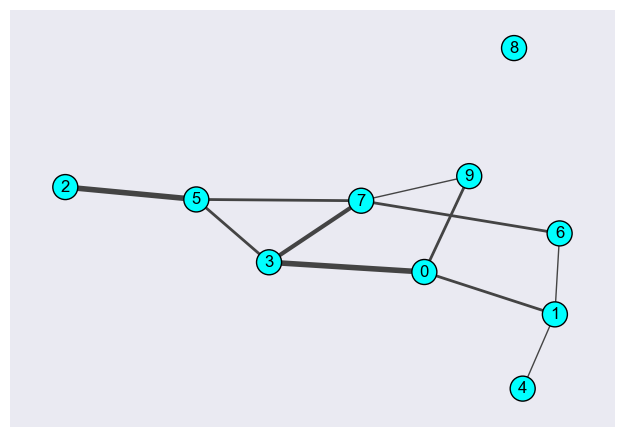

In [29]:
np.random.seed(10)

num_nodes = 10
edge_probability = 0.3


upper_tri = np.triu(np.random.randint(1, 5, size=(num_nodes, num_nodes)) * (np.random.rand(num_nodes, num_nodes) < edge_probability), 1)
uW = upper_tri + upper_tri.T

print(uW)

g_utest_w=ig.Graph.Weighted_Adjacency(uW, mode="undirected", loops=False)
uweights = (g_utest_w.es["weight"])

vertex_label = np.arange(0,uW.shape[0])
color = "cyan"

fig, ax = plt.subplots(figsize=(7,5))
fig.tight_layout(pad=1.5)
ig.plot(g_utest_w,vertex_color=color,vertex_label=vertex_label, vertex_size=25, edge_width=uweights, target=ax);

df_utest_w=im.graph_info(uW)
df_utest_w

Partitioning the network: 100%|████████████| 10/10 [00:00<00:00, 39.27it/s]


Done! Number of partitions: 2

Map equation value (implemented Infomap): 	2.905401215039532
Map equation value (built-in Infomap): 		3.20464348223866

Rateo: 						1.1029951614428084
Difference: 					0.29924226719912816


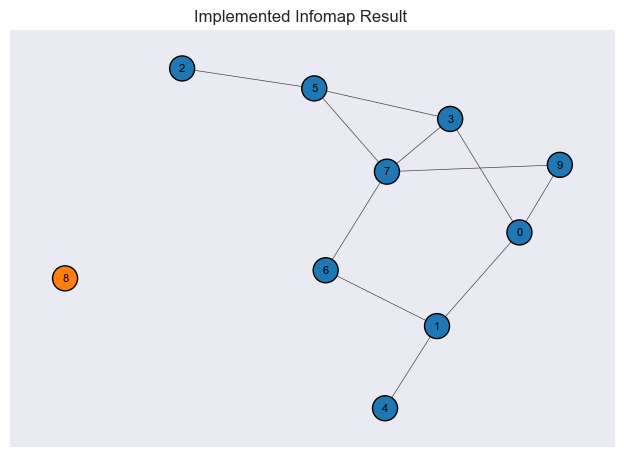

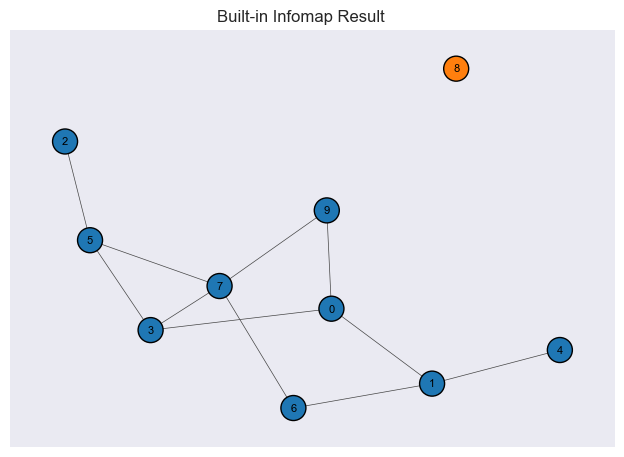

In [30]:
best_modules_utest_w, final_links_utest_w, final_partition_utest_w = im.community_partitioning(adjacency_matrix=uW, 
                                                                    pagerank_on=True,
                                                                    d=0.85, 
                                                                    tol=1e-10, 
                                                                    iterations=10, 
                                                                    shuffle=False,
                                                                    normalize_weights=True,
                                                                    normalize_weights_after_merging=False,
                                                                    verbose=False) 

infomap_value = im.map_equation(best_modules_utest_w)

# check with the built-in function:
infomap_partition_utest_w, infomap_codelength = built_in_check(g_utest_w)

alpha_utest_w = infomap_codelength/infomap_value
delta_utest_w = infomap_codelength - infomap_value

print(f"\nMap equation value (implemented Infomap): \t{infomap_value}")
print(f"Map equation value (built-in Infomap): \t\t{infomap_codelength}")

print(f"\nRateo: \t\t\t\t\t\t{alpha_utest_w}")
print(f"Difference: \t\t\t\t\t{delta_utest_w}")


im.visualize_partitions(g_utest_w,final_partition_utest_w,layout="auto", title="Implemented Infomap Result")
im.visualize_partitions(g_utest_w,infomap_partition_utest_w,layout="auto",title="Built-in Infomap Result")

### 3.2. Simple directed networks

#### 3.2.1 Directed unweighted graph

,node,freq,linked_nodes,weights
0,0,0.266657,[6],[1.0]
1,1,0.039567,"[0, 7]","[0.5, 0.5]"
2,2,0.048981,"[1, 5]","[0.5, 0.5]"
3,3,0.035566,[2],[1.0]
4,4,0.271872,[0],[1.0]
5,5,0.039567,"[3, 7]","[0.5, 0.5]"
6,6,0.245408,[4],[1.0]
7,7,0.052382,[4],[1.0]


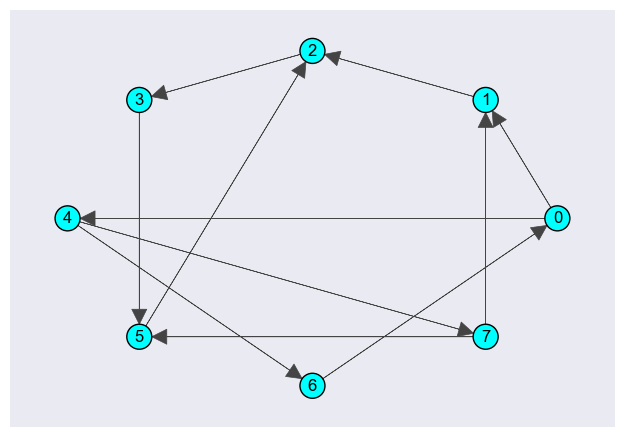

In [31]:
dA_1 = np.array([[0, 1, 0, 0, 1, 0, 0, 0],  
                [0, 0, 1, 0, 0, 0, 0, 0],  
                [0, 0, 0, 1, 0, 0, 0, 0],  
                [0, 0, 0, 0, 0, 1, 0, 0],  
                [0, 0, 0, 0, 0, 0, 1, 1],  
                [0, 0, 1, 0, 0, 0, 0, 0],  
                [1, 0, 0, 0, 0, 0, 0, 0],  
                [0, 1, 0, 0, 0, 1, 0, 0]])

g_dtest_1 = ig.Graph.Adjacency(dA_1, mode="directed", loops=False)

vertex_label = np.arange(0,dA_1.shape[0])
color = "cyan"

fig, ax = plt.subplots(figsize=(7,5))
fig.tight_layout(pad=1.5)
ig.plot(g_dtest_1,vertex_color=color,vertex_label=vertex_label, vertex_size=25, edge_width=0.5, layout="circle", target=ax);

df_directed=im.graph_info(dA_1)
df_directed

Partitioning the network: 100%|██████████████| 5/5 [00:00<00:00, 38.79it/s]


Done! Number of partitions: 3

Map equation value (implemented Infomap): 	1.8097757529967171
Map equation value (built-in Infomap): 		2.4709962914013888

Rateo: 						1.3653604803301125
Difference: 					0.6612205384046717


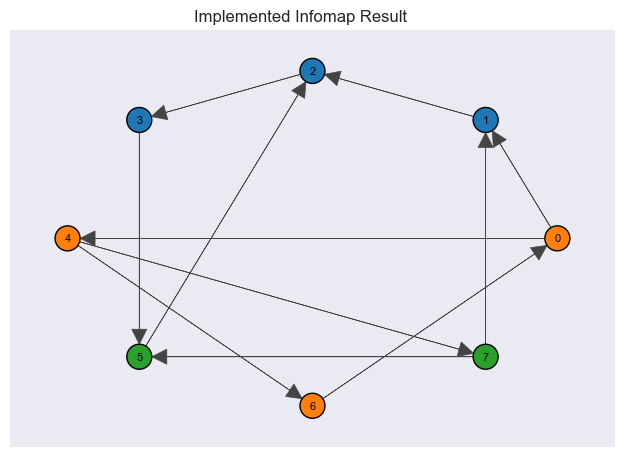

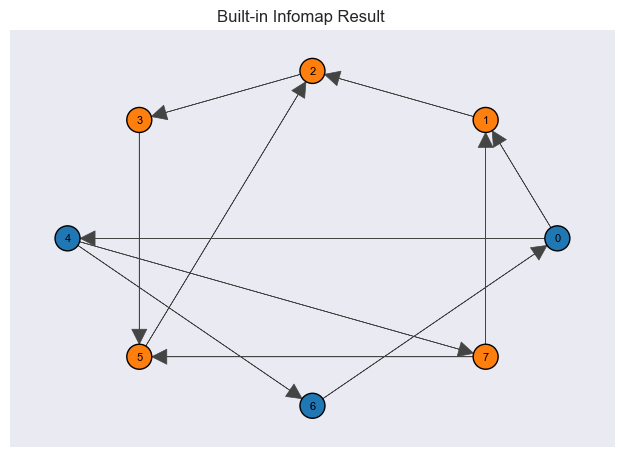

In [32]:
best_modules_dtest_1, final_links_dtest_1, final_partition_dtest_1 = im.community_partitioning(adjacency_matrix=dA_1, 
                                                                    pagerank_on=False,
                                                                    d=0.85, 
                                                                    tol=1e-10, 
                                                                    iterations=5, 
                                                                    shuffle=True,
                                                                    normalize_weights=True,
                                                                    normalize_weights_after_merging=False,
                                                                    move_out=False,
                                                                    verbose=False)   

infomap_value = im.map_equation(best_modules_dtest_1)

# check with the built-in function:
infomap_partition_dtest_1, infomap_codelength = built_in_check(g_dtest_1)

alpha_dtest_1 = infomap_codelength/infomap_value
delta_dtest_1 = infomap_codelength - infomap_value

print(f"\nMap equation value (implemented Infomap): \t{infomap_value}")
print(f"Map equation value (built-in Infomap): \t\t{infomap_codelength}")

print(f"\nRateo: \t\t\t\t\t\t{alpha_dtest_1}")
print(f"Difference: \t\t\t\t\t{delta_dtest_1}")


im.visualize_partitions(g_dtest_1,final_partition_dtest_1,layout="circle", title="Implemented Infomap Result")
im.visualize_partitions(g_dtest_1,infomap_partition_dtest_1,layout="circle",title="Built-in Infomap Result")

#### 3.2.2. Directed weighted graph

,node,freq,linked_nodes,weights
0,0,0.024463,[],[]
1,1,0.048427,[],[]
2,2,0.029744,[],[]
3,3,0.015000,[],[]
4,4,0.020343,[1],[1.0]
5,5,0.019371,[],[]
6,6,0.018729,"[0, 1]","[0.2, 0.8]"
7,7,0.017550,"[0, 2, 6]","[0.25, 0.5, 0.25]"
8,8,0.015000,"[0, 1, 4, 5, 7]","[0.2, 0.26666666666666666, 0.13333333333333333..."
9,9,0.015000,"[2, 4, 5]","[0.5714285714285714, 0.2857142857142857, 0.142..."


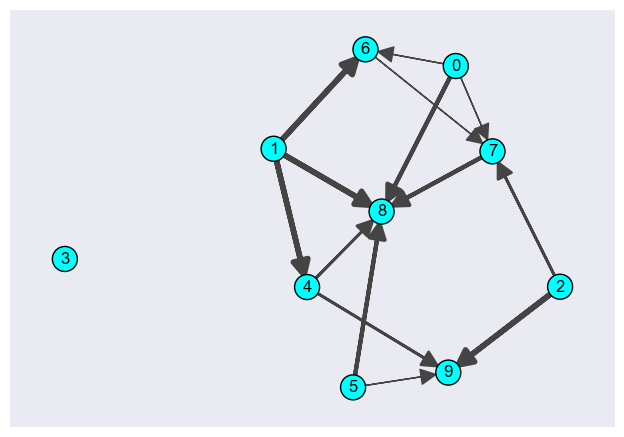

In [33]:
np.random.seed(42)

num_nodes = 10
edge_probability = 0.3


upper_tri = np.triu(np.random.randint(1, 5, size=(num_nodes, num_nodes)) * (np.random.rand(num_nodes, num_nodes) < edge_probability), 1)
dW = upper_tri 


g_dtest_w=ig.Graph.Weighted_Adjacency(dW, mode="directed", loops=False)
dweights = (g_dtest_w.es["weight"])#/np.sum(g_utest_w.es["weight"]))*100

vertex_label = np.arange(0,dW.shape[0])
color = "cyan"

fig, ax = plt.subplots(figsize=(7,5))
fig.tight_layout(pad=1.5)
ig.plot(g_dtest_w,vertex_color=color,vertex_label=vertex_label, vertex_size=25, edge_width=dweights, target=ax);

df_dtest_w=im.graph_info(dW)
df_dtest_w

Partitioning the network: 100%|████████████| 10/10 [00:00<00:00, 39.74it/s]


Done! Number of partitions: 2

Map equation value (implemented Infomap): 	0.7062520630922968
Map equation value (built-in Infomap): 		3.2149640615604382

Rateo: 						4.552148205392625
Difference: 					2.5087119984681414


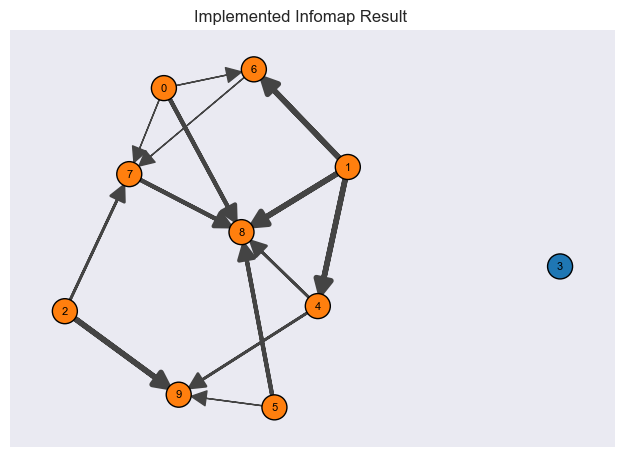

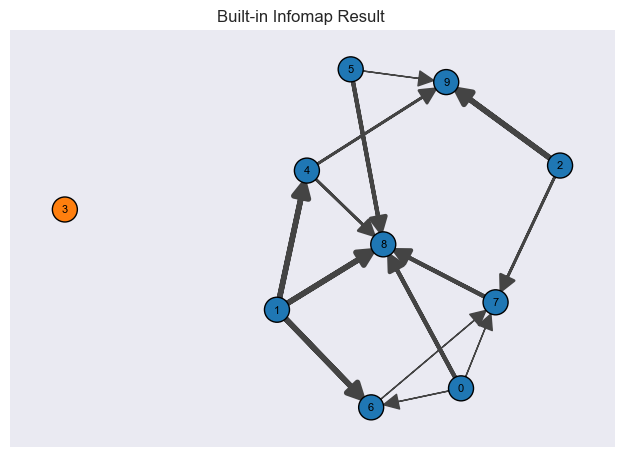

In [34]:
best_modules_dtest_w, final_links_dtest_w, final_partition_dtest_w = im.community_partitioning(adjacency_matrix=dW, 
                                                                    pagerank_on=True,
                                                                    d=0.85, 
                                                                    tol=1e-10, 
                                                                    iterations=10, 
                                                                    shuffle=False,
                                                                    normalize_weights=True,
                                                                    normalize_weights_after_merging=True,
                                                                    move_out=True,
                                                                    verbose=False)   

infomap_value = im.map_equation(best_modules_dtest_w)

# check with the built-in function:
infomap_partition_dtest_w, infomap_codelength = built_in_check(g_dtest_w)

alpha_dtest_w = infomap_codelength/infomap_value
delta_dtest_w = infomap_codelength - infomap_value

print(f"\nMap equation value (implemented Infomap): \t{infomap_value}")
print(f"Map equation value (built-in Infomap): \t\t{infomap_codelength}")

print(f"\nRateo: \t\t\t\t\t\t{alpha_dtest_w}")
print(f"Difference: \t\t\t\t\t{delta_dtest_w}")


im.visualize_partitions(g_dtest_w,final_partition_dtest_w,layout="auto",edge_width=dweights, title="Implemented Infomap Result")
im.visualize_partitions(g_dtest_w,infomap_partition_dtest_w,layout="auto",edge_width=dweights,title="Built-in Infomap Result")

### 3.3. StarWars social network dataset

<img title="Star-Ward " src="star-wars-a-new-hope.jpeg"  width="700">

The dataset  contains the social network of Star Wars characters extracted from the movie scripts [4]. If two characters speak together within the same scene, they have been connected.

Content:

* starwars-episode-N-interactions.json: contains the social network extracted from Episode N, where the links between characters are defined by the times the characters speak within the same scene.

* starwars-episode-N-mentions.json: contains the social network extracted from Episode N, where the links between characters are defined by the times the characters are mentioned within the same scene.

* starwars-episode-N-interactions-allCharacters.json: is the interactions network with R2-D2 and Chewbacca added in using data from mentions network.

* starwars-full-…: contain the corresponding social networks for the whole set of 7 episodes.

Nodes:

- name: Name of the character
- value: Number of scenes the character appeared in
- colour: Colour in the visualization

Links: 

- source: zero-based index of the character that is one end of the link, the order of nodes is the order in which they are listed in the “nodes” element
- target: zero-based index of the character that is the the other end of the link.
- value: Number of scenes where the “source character” and “target character” of the link appeared together.

The network is undirected and which character represents the source and the target is arbitrary, they correspond only to two ends of the link.

-----
[4] https://www.kaggle.com/datasets/ruchi798/star-wars

number of nodes: 22



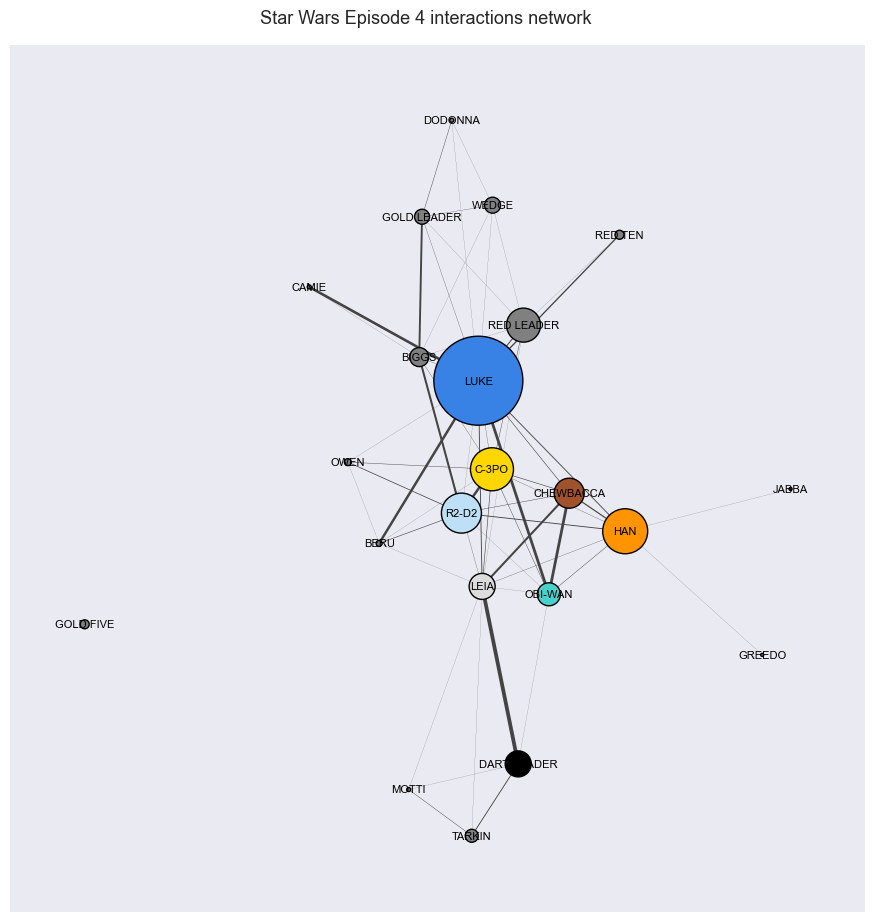

In [35]:
full = False
all_character = True #this includes also R2D2 and Chewbacca
episode = 4
interaction_list = ["interactions", "mentions"]
interacion_type = interaction_list[0]


if full:
    if all_character:
        data_name = f"star_wars_network/starwars-full-interactions-allCharacters.json"
    elif interacion_type == "interactions":
        data_name = f"star_wars_network/starwars-full-{interacion_type}.json"
    elif interacion_type == "mentions":
        data_name = f"star_wars_network/starwars-full-{interacion_type}.json"

else:
    if interacion_type == "interactions":
        if all_character:
            data_name = f"star_wars_network/starwars-episode-{episode}-interactions-allCharacters.json"
        else:
            data_name = f"star_wars_network/starwars-episode-{episode}-interactions.json"
    
    if interacion_type == "mentions":
        data_name = f"star_wars_network/starwars-episode-{episode}-mentions.json"
            

data = json.load(open(data_name))

N_nodes_sw = len(data["nodes"])
print("number of nodes: {}\n".format(N_nodes_sw))

# nodes information:
sw_nodes_names = []
sw_nodes_values = []
sw_nodes_colors = []

for node in data["nodes"]:
    sw_nodes_names.append(node["name"])
    sw_nodes_values.append(node["value"])
    sw_nodes_colors.append(node["colour"])
    

# edge information:
sw_edges =[]
sw_edges_sources = []
sw_edges_targets = []
sw_edges_values = []

for edge in data["links"]:
    sw_edges.append((data['nodes'][edge['source']]['name'], data['nodes'][edge['target']]['name']))
    sw_edges_sources.append(edge["source"])
    sw_edges_targets.append(edge["target"])
    sw_edges_values.append(edge["value"])


sw_df_nodes = pd.DataFrame({"names": sw_nodes_names, "value": sw_nodes_values, "colors":sw_nodes_colors})
sw_df_edges = pd.DataFrame({"source":sw_edges_sources,"target":sw_edges_targets,"value":sw_edges_values})

# weight matrix
W_sw = np.zeros((N_nodes_sw,N_nodes_sw))
for target,source,value in zip(sw_df_edges["source"],sw_df_edges["target"],sw_df_edges["value"]):
    W_sw[target,source] = value
    W_sw[source,target] = value

# binary adjacent matrix
A_sw = (W_sw !=0).astype(int)

g_sw = ig.Graph.Weighted_Adjacency(W_sw, mode="undirected", loops=False)

sw_weights_plot = (sw_edges_values/np.sum(sw_edges_values))*30
sw_nodes_values_plot = sw_nodes_values 

layout="auto"
plt_size=(10,10)

fig, ax = plt.subplots(figsize=plt_size)
fig.tight_layout(pad=3)
fig.suptitle("Star Wars Episode {} {} network".format(episode,interacion_type),size=13)
ig.plot(g_sw,
        target=ax,
        vertex_size=sw_nodes_values_plot,
        vertex_label=sw_nodes_names,
        vertex_label_size=8.0,
        vertex_color = sw_nodes_colors, 
        edge_width = sw_weights_plot,
        layout = layout);

In [36]:
df_sw=im.graph_info(W_sw)
df_sw["node"] = sw_nodes_names

df_sw.sort_values(by=["freq"],ascending=False)[:5]

,node,freq,linked_nodes,weights
3,LUKE,0.180919,"[0, 1, 2, 5, 6, 7, 8, 9, 10, 13, 16, 17, 18, 1...","[0.109375, 0.109375, 0.140625, 0.015625, 0.031..."
13,HAN,0.113291,"[0, 1, 2, 3, 7, 10, 14, 15]","[0.07407407407407407, 0.2345679012345679, 0.07..."
2,C-3PO,0.085281,"[0, 1, 3, 6, 7, 8, 9, 10, 13, 19]","[0.2698412698412698, 0.06349206349206349, 0.28..."
7,LEIA,0.080981,"[0, 1, 2, 3, 4, 6, 8, 10, 11, 12, 13, 19]","[0.08928571428571429, 0.14285714285714285, 0.1..."
0,R2-D2,0.070094,"[1, 2, 3, 6, 7, 8, 9, 10, 13]","[0.057692307692307696, 0.3269230769230769, 0.2..."


Partitioning the network: 100%|████████████| 10/10 [00:00<00:00, 28.45it/s]


Done! Number of partitions: 8

Map equation value (implemented Infomap): 	3.369411960999278
Map equation value (built-in Infomap): 		4.249406475195772

Rateo: 						1.2611715410232922
Difference: 					0.8799945141964942


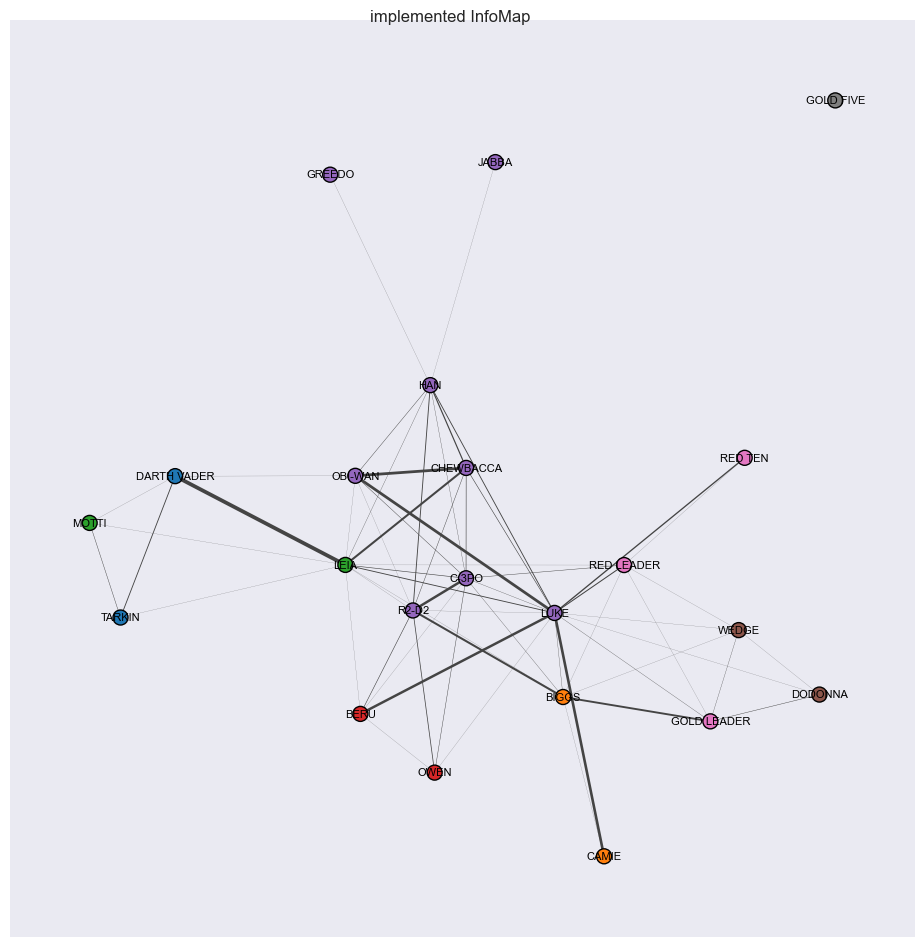

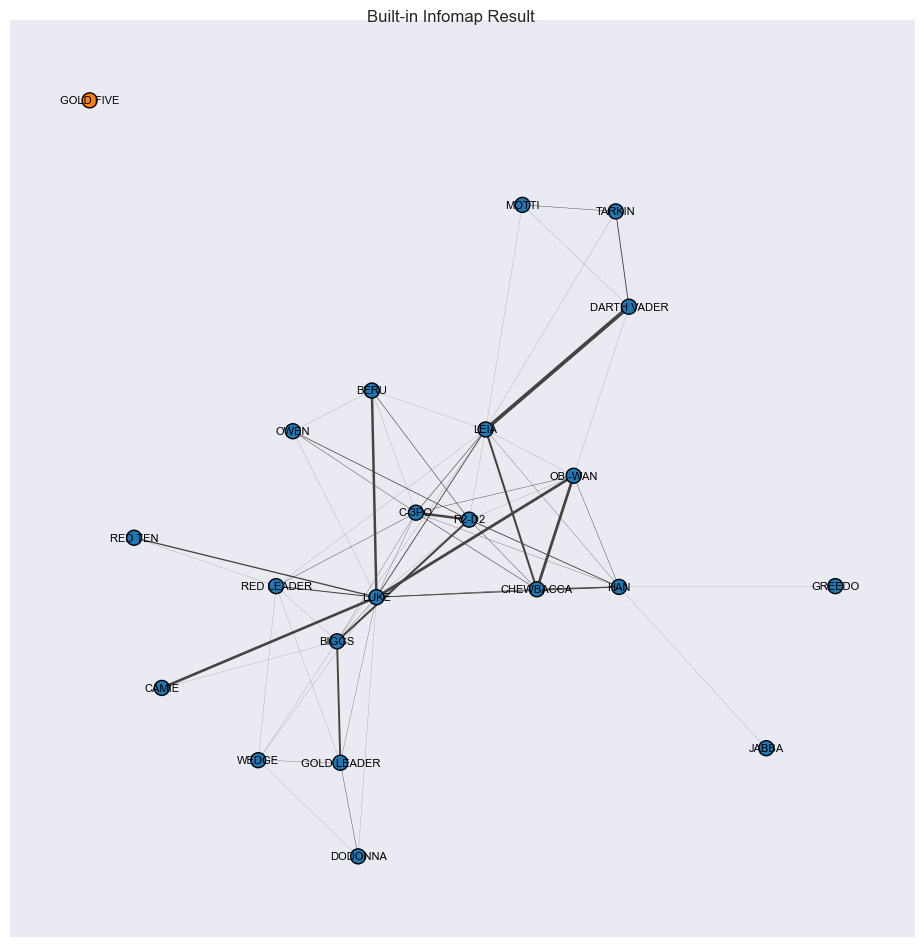

In [37]:
best_modules_sw, final_links_sw, final_partition_sw = im.community_partitioning(adjacency_matrix=W_sw, 
                                                                    pagerank_on=True,
                                                                    d=0.85, 
                                                                    tol=1e-10, 
                                                                    iterations=10, 
                                                                    shuffle=False,
                                                                    normalize_weights=True,
                                                                    normalize_weights_after_merging=False,
                                                                    verbose=False) 

infomap_value = im.map_equation(best_modules_sw)

# check with the built-in function
infomap_partition_sw, infomap_codelength = built_in_check(g_sw)

alpha_sw = infomap_codelength/infomap_value
delta_sw = infomap_codelength - infomap_value

print(f"\nMap equation value (implemented Infomap): \t{infomap_value}")
print(f"Map equation value (built-in Infomap): \t\t{infomap_codelength}")

print(f"\nRateo: \t\t\t\t\t\t{alpha_sw}")
print(f"Difference: \t\t\t\t\t{delta_sw}")


layout="auto"
plt_size=(10,10)

im.visualize_partitions(g_sw,final_partition_sw,
                        layout=layout,
                        edge_width=sw_weights_plot,
                        vertex_label=sw_nodes_names,
                        vertex_label_size=8.0, 
                        vertex_size=15,
                        plot_size=plt_size, 
                        title="implemented InfoMap")


im.visualize_partitions(g_sw,infomap_partition_sw,
                        layout=layout,
                        edge_width=sw_weights_plot,
                        vertex_label=sw_nodes_names,
                        vertex_label_size=8.0, 
                        vertex_size=15,
                        plot_size=plt_size, 
                        title="Built-in Infomap Result")

### 3.4. Kongsfjord network dataset

<img title="Konngsfiord " src="kongsfjord.jpeg"  width="900">

Kongsfjorden (or Kings Bay) is an inlet on the west coast of Spitsbergen, an island which is part of the Svalbard archipelago in the Arctic Ocean.

The dataset contains the consumer-resource interaction between micorobiotes present in the area [5].

______
[5] https://github.com/Ecological-Complexity-Lab/infomap_ecology_package/tree/infomap_ecology_v2/data

In [38]:
kong_nodes_df = pyreadr.read_r("kongsfjorden_nodes.RData")
kong_links_df = pyreadr.read_r("kongsfjorden_links.RData")

print(kong_nodes_df["kongsfjorden_nodes"][:5])
print()
print(kong_links_df["kongsfjorden_links"][:5])

kong_nodes_names = [kong_nodes_df["kongsfjorden_nodes"]["Species"][i] for i in range(len(kong_nodes_df["kongsfjorden_nodes"]["Species"]))]
kong_links = [(kong_links_df["kongsfjorden_links"]["consumer"][i],kong_links_df["kongsfjorden_links"]["resource"][i]) for i in range(len(kong_links_df["kongsfjorden_links"]["ConsumerNodeID"]))]

   NodeID                        Species FeedingType  Mobility Environment
0       1          Phaeocystis pouchetii        none         1     pelagic
1       2           Chaetoceros socialis        none         1     pelagic
2       3  Thalassiosira nordenskioeldii        none         1     pelagic
3       4                 Fragilariopsis        none         1     pelagic
4       5                Protoperidinium        none         1     pelagic

   code               consumer                       resource  ConsumerNodeID  \
0     1  Calanus finnmarchicus          Phaeocystis pouchetii              22   
1     2  Calanus finnmarchicus           Chaetoceros socialis              22   
2     3  Calanus finnmarchicus  Thalassiosira nordenskioeldii              22   
3     4  Calanus finnmarchicus                 Fragilariopsis              22   
4     5  Calanus finnmarchicus                Protoperidinium              22   

   ResourceNodeID  
0               1  
1               2  
2 

number of nodes: 262



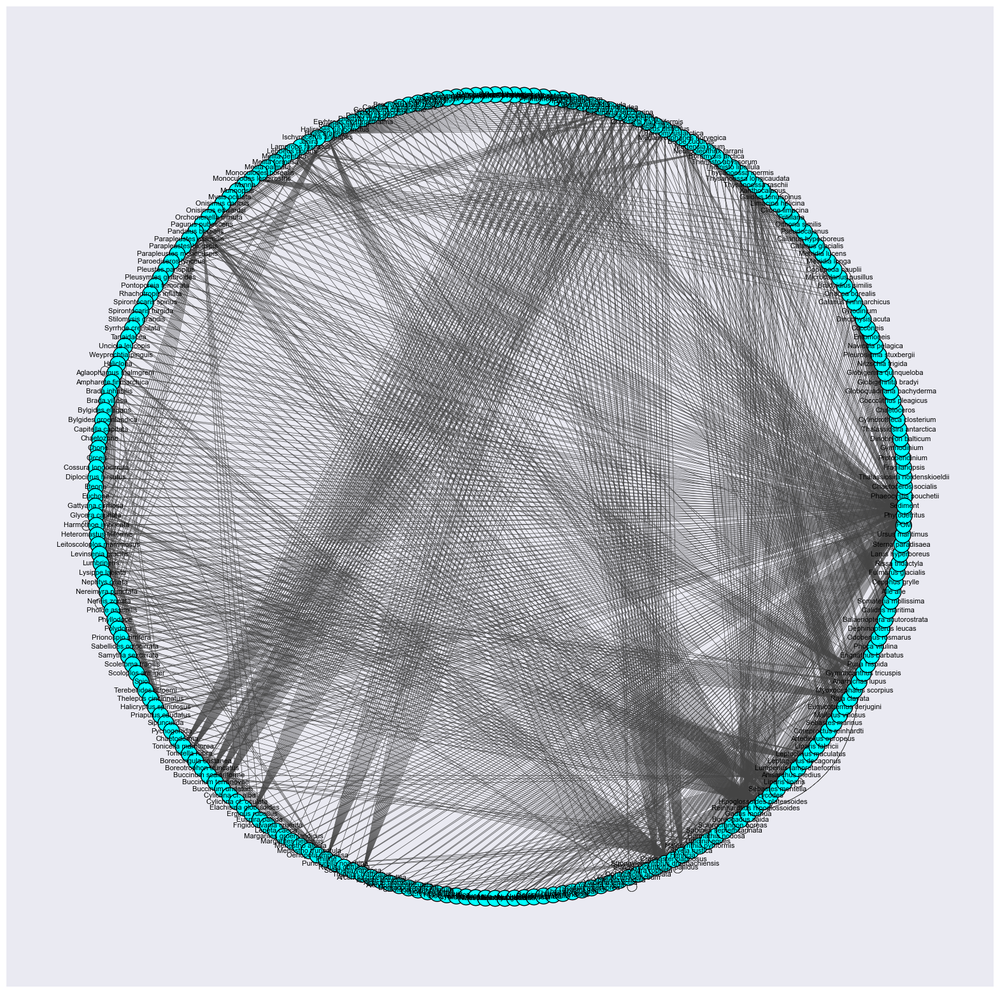

In [39]:
N_nodes_kong = len(kong_nodes_names)
print("number of nodes: {}\n".format(N_nodes_kong))

g_kong = ig.Graph(N_nodes_kong)
g_kong.vs["name"] = kong_nodes_names
g_kong.add_edges(kong_links)
g_kong.degree(mode="in")
A_kong = ig.Graph.get_adjacency(g_kong)




layout = "circle"
plt_size = (20,20)

fig, ax = plt.subplots(figsize=plt_size)
ig.plot(g_kong,
        target=ax,
        vertex_size=25,
        vertex_label=kong_nodes_names,
        vertex_label_size=8.0,
        vertex_color = "cyan", 
        layout = layout,
        edge_width=0.5);

In [40]:
df_kong=im.graph_info(A_kong)
df_kong["node"] = kong_nodes_names

df_kong.sort_values(by=["freq"],ascending=False)[:5]

,node,freq,linked_nodes,weights
260,Phytodetritus,0.055726,"[21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 3...","[0.0058823529411764705, 0.0058823529411764705,..."
261,Sediment,0.033372,"[43, 47, 65, 66, 67, 68, 69, 71, 75, 76, 77, 7...","[0.009259259259259259, 0.009259259259259259, 0..."
224,Gadus morhua,0.027530,"[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 6...","[0.011764705882352941, 0.011764705882352941, 0..."
259,POM,0.019472,"[21, 22, 24, 25, 26, 27, 28, 29, 32, 33, 34, 3...","[0.017543859649122806, 0.017543859649122806, 0..."
215,Crossaster papposus,0.018053,"[48, 53, 54, 84, 100, 118, 119, 120, 121, 122,...","[0.015873015873015872, 0.015873015873015872, 0..."


Partitioning the network: 100%|██████████████| 2/2 [00:14<00:00,  7.38s/it]


Done! Number of partitions: 66

Map equation value (implemented Infomap): 	3.4096137377895817
Map equation value (built-in Infomap): 		7.097577621366753

Rateo: 						2.081636856017609
Difference: 					3.6879638835771713


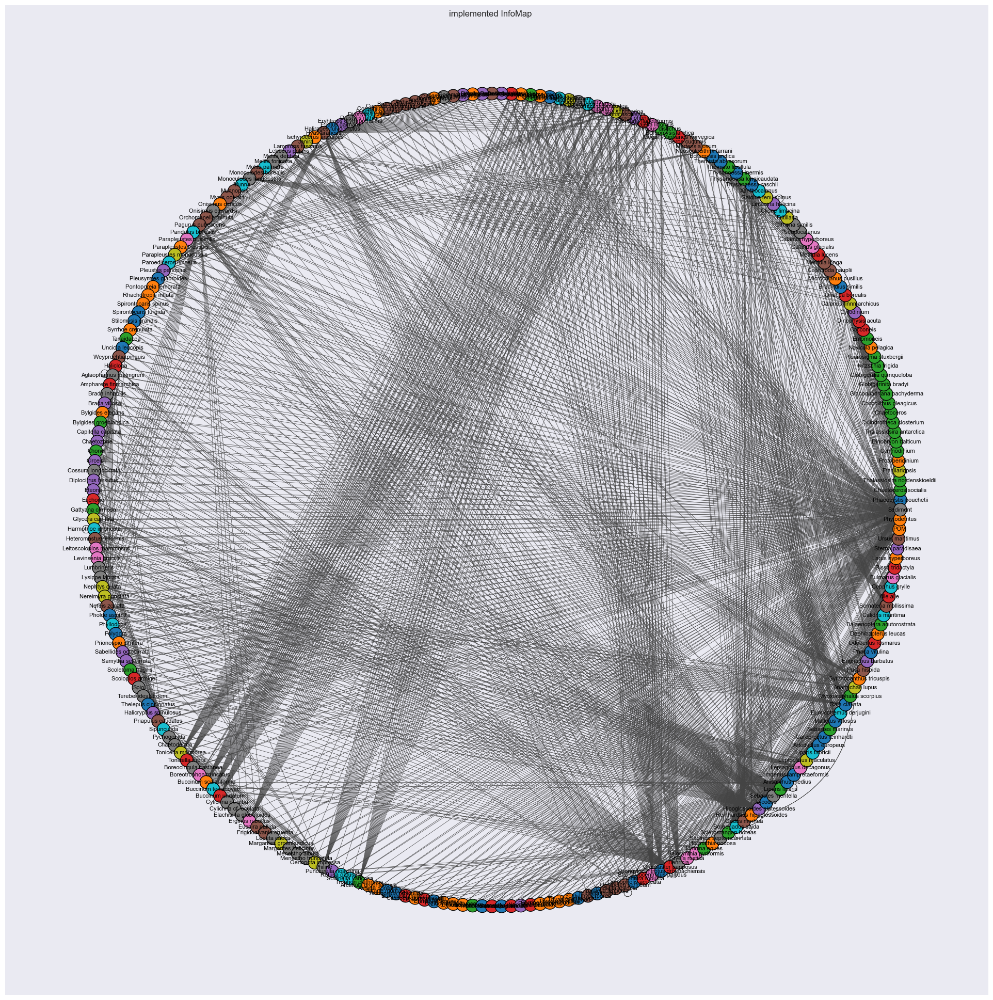

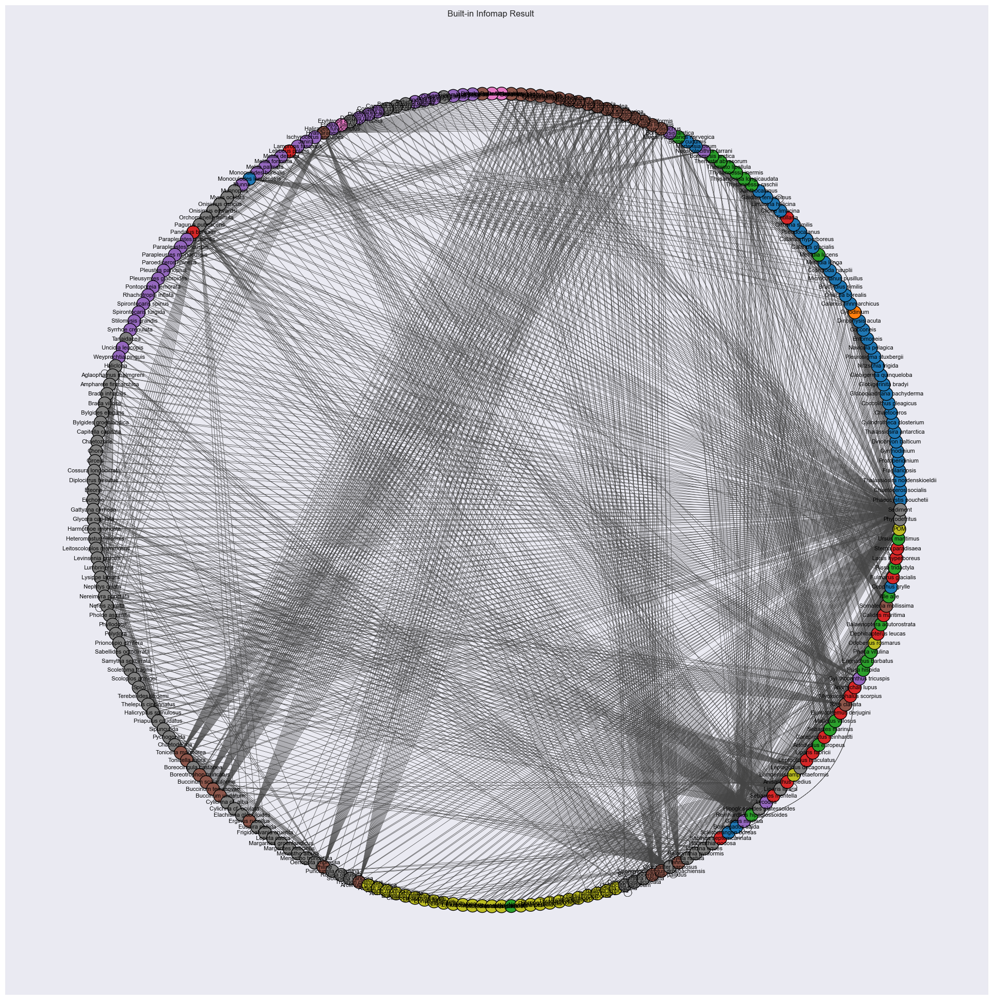

In [41]:
best_modules_kong, final_links_kong, final_partition_kong = im.community_partitioning(adjacency_matrix=A_kong, 
                                                                    pagerank_on=True,
                                                                    d=0.85, 
                                                                    tol=1e-10, 
                                                                    iterations=2, 
                                                                    shuffle=True,
                                                                    normalize_weights=True,
                                                                    normalize_weights_after_merging=True,
                                                                    verbose=False)   

infomap_value = im.map_equation(best_modules_kong)

# check with the built-in function
infomap_partition_kong, infomap_codelength = built_in_check(g_kong)

alpha_kong = infomap_codelength/infomap_value
delta_kong = infomap_codelength - infomap_value

print(f"\nMap equation value (implemented Infomap): \t{infomap_value}")
print(f"Map equation value (built-in Infomap): \t\t{infomap_codelength}")

print(f"\nRateo: \t\t\t\t\t\t{alpha_kong}")
print(f"Difference: \t\t\t\t\t{delta_kong}")

layout = "circle"
plt_size = (20,20)

im.visualize_partitions(g_kong,final_partition_kong,
                           layout=layout, 
                           vertex_label=kong_nodes_names, 
                           plot_size=plt_size,   
                           title="implemented InfoMap")

im.visualize_partitions(g_kong,infomap_partition_kong,
                        layout=layout,
                        vertex_label=kong_nodes_names,
                        vertex_label_size=8.0, 
                        vertex_size=25,
                        plot_size=plt_size, 
                        title="Built-in Infomap Result")

## 4. Conclusions and future works

The Infomap algorithm has proven to be a powerful tool for simplifying complex networks and extracting valuable information by analyzing how the network's structure influences the system's behavior.

Our implementation for both mono-layer directed and undirected networks has produced robust results that are comparable to, and in some cases, better than those obtained using the built-in algorithm in Python's $\texttt{igraph}$ package. However, achieving such results requires careful fine-tuning of the algorithm parameters, which involves a trial-and-error approach. The algorithm is also highly sensitive to how we evaluate the visiting frequencies for each node, the exit frequencies of the modules, and the order of binary merging of the modules.

Future work should focus on efficiently merging modules to reduce computational time and extending the algorithm's structure to accommodate multilayer networks. Exploring these areas could further enhance the utility and performance of the Infomap algorithm in analyzing complex network structures.